In [29]:
!pip install opendatasets --quiet
!pip install plotly --quiet
!pip install folium --quiet
!pip install matplotlib --quiet
!pip install seaborn --quiet
!pip install plotly --quiet
!pip install wordcloud --quiet
!pip install pandas --quiet

In [15]:
import opendatasets as od
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
import wordcloud
%matplotlib inline

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import wordcloud

import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px

In [17]:
data = pd.read_csv('Chicago_Crime_2020.csv')

In [18]:
top_location_description=data['Location Description'].value_counts().to_dict()
top_location_description
# top_location_description_groupby = data.groupby('Location Description')
# top_location_description_groupby

{'STREET': 50517,
 'RESIDENCE': 39005,
 'APARTMENT': 36053,
 'SIDEWALK': 13411,
 'SMALL RETAIL STORE': 5271,
 'OTHER (SPECIFY)': 5003,
 'ALLEY': 4723,
 'PARKING LOT / GARAGE (NON RESIDENTIAL)': 4629,
 'RESTAURANT': 3537,
 'GAS STATION': 3437,
 'RESIDENCE - YARD (FRONT / BACK)': 3388,
 'RESIDENCE - PORCH / HALLWAY': 3261,
 'VEHICLE NON-COMMERCIAL': 3158,
 'GROCERY FOOD STORE': 2556,
 'RESIDENCE - GARAGE': 2443,
 'DEPARTMENT STORE': 2323,
 'CONVENIENCE STORE': 1974,
 'COMMERCIAL / BUSINESS OFFICE': 1580,
 'OTHER': 1386,
 'CTA TRAIN': 1137,
 'DRUG STORE': 1081,
 'PARKING LOT/GARAGE(NON.RESID.)': 930,
 'BANK': 874,
 'PARK PROPERTY': 871,
 'HOSPITAL BUILDING / GROUNDS': 863,
 'HOTEL / MOTEL': 772,
 'CTA BUS': 737,
 'RESIDENCE PORCH/HALLWAY': 687,
 'BAR OR TAVERN': 684,
 'CHA APARTMENT': 671,
 'POLICE FACILITY / VEHICLE PARKING LOT': 639,
 'SCHOOL, PUBLIC, BUILDING': 622,
 'DRIVEWAY - RESIDENTIAL': 611,
 'CTA STATION': 575,
 'NURSING / RETIREMENT HOME': 537,
 'CTA PLATFORM': 520,
 'RESIDENTI

### Q- How do the trends in the distribution of different crime types vary over the years?


The analysis focused on understanding the distribution of various crime types across three consecutive years: 2020, 2021, and 2022 in Chicago. The dataset contained information about crime occurrences, categorized by type, allowing an exploration of yearly trends.

In [3]:
!pip install --upgrade pip --user

     ---------------------------------------- 2.1/2.1 MB 4.8 MB/s eta 0:00:00


ERROR: To modify pip, please run the following command:
C:\Users\sanja\anaconda3\python.exe -m pip install --upgrade pip --user


In [4]:
!pip install --upgrade Pillow --user

     ---------------------------------------- 2.6/2.6 MB 3.2 MB/s eta 0:00:00


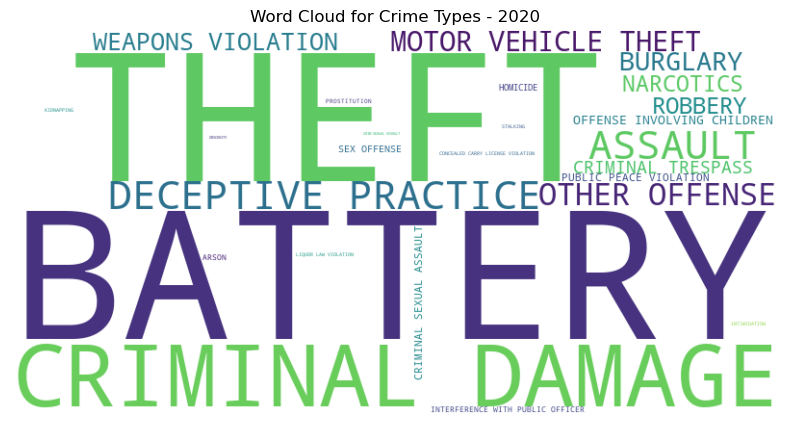

In [8]:
top_location_description=data['Primary Type'].value_counts().to_dict()

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_location_description)

# Create a plot
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Crime Types - 2020')
plt.show()

In [9]:
data2021 = pd.read_csv('Chicago_Crime_2021.csv')
data2022 = pd.read_csv('Chicago_Crime_2022.csv')

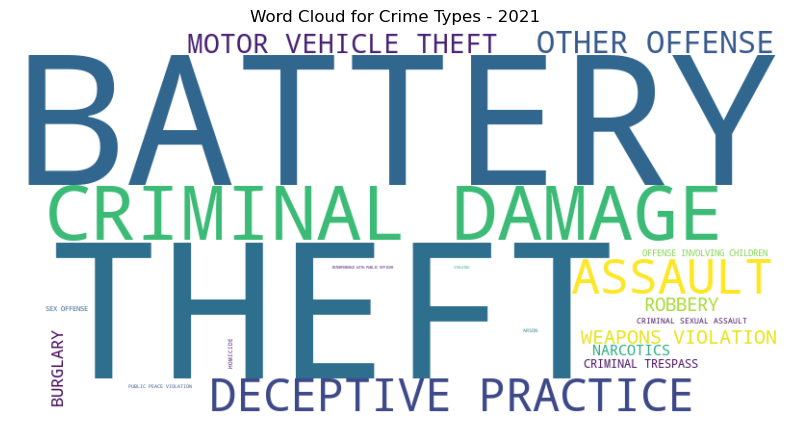

In [10]:
top_location_description=data2021['Primary Type'].value_counts().to_dict()

from wordcloud import WordCloud



wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_location_description)

# Create a plot
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Crime Types - 2021')
plt.show()

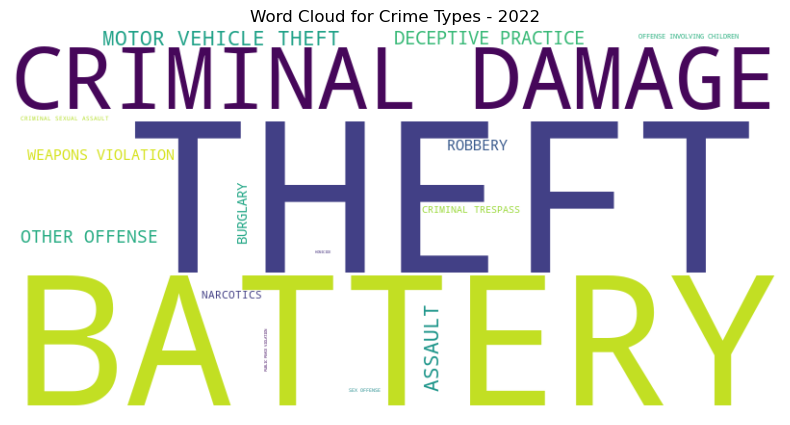

In [11]:
top_location_description=data2022['Primary Type'].value_counts().to_dict()

from wordcloud import WordCloud



wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_location_description)

# Create a plot
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Crime Types - 2022')
plt.show()

### **Findings:**

- Yearly Crime Comparison: Visual analysis revealed a consistent trend across the years, indicating that theft, battery, and criminal damage remained among the most prevalent crimes in Chicago.

- Stable Crime Trends: The frequency of these major crime types showed relative stability over the three years, suggesting a persistent occurrence without significant fluctuations.

### **Insights:**

- Consistent Crime Patterns: Despite yearly variations in societal conditions or law enforcement efforts, the prevalence of theft, battery, and criminal damage persisted throughout the observed period.

- Possible Crime Hotspots: The consistent high occurrence of these crime types may indicate areas or contexts prone to these offenses, warranting further investigation for targeted preventive measures or intervention strategies.

- This analysis provides an initial glimpse into the sustained dominance of certain crime types over consecutive years, highlighting the need for in-depth studies to understand the underlying causes and devise effective crime mitigation strategies.

# Q: How Has the Distribution of Crime Types in Different Locations Evolved Over the Years in Chicago?

The analysis aimed to understand the changes in the distribution of crime types across various locations in Chicago over the span of two consecutive years: 2020 and 2021.

Our initial hypothesis was that the COVID-19 pandemic might cause an initial surge in crime rates during 2020 due to potential socioeconomic disruptions, followed by a gradual decline in subsequent years as law enforcement and community measures improved. We anticipated a decrease in crime incidents, particularly in street and residential areas, over time due to expected interventions and societal adaptations to the pandemic.

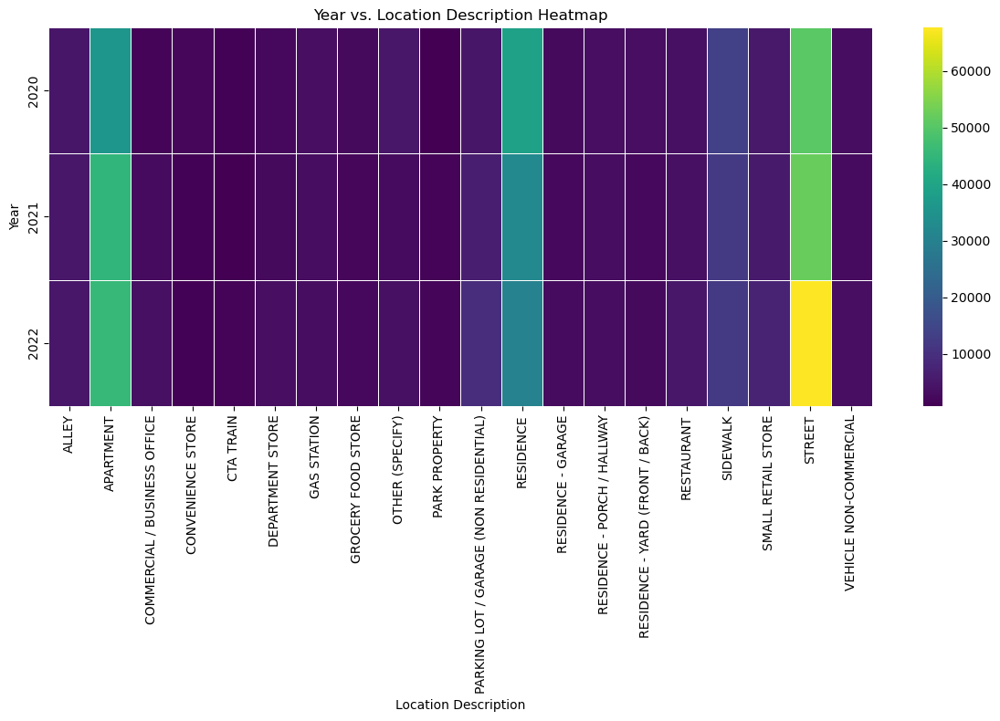

In [19]:
crime_df = pd.read_csv('Chicago_Crime_all.csv')
top_locations = crime_df['Location Description'].value_counts().nlargest(20).index
filtered_data = crime_df[crime_df['Location Description'].isin(top_locations)]
year_location_data = filtered_data[['Year', 'Location Description']]

# Group the data by Year and Location Description and count occurrences
year_location_count = year_location_data.groupby(['Year', 'Location Description']).size().reset_index(name='Count')
# Pivot the data to create a heatmap
heatmap_data = year_location_count.pivot('Year', 'Location Description', 'Count')

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='viridis', cbar=True, linewidths=0.5)
plt.xlabel('Location Description')
plt.ylabel('Year')
plt.title('Year vs. Location Description Heatmap')
plt.xticks(rotation=90)

# Show the plot
plt.tight_layout()
plt.show()

#### **Observation**

Contrary to our hypothesis, the analysis of crime distribution across different locations in Chicago unveiled unexpected trends:

- **Stable High Crime Locations:** Residential areas, including "APARTMENT" and "RESIDENCE," consistently experienced high crime rates over the three-year period.

- **Persistent Street Crime:** The category "STREET" consistently reported the highest counts of crime incidents throughout the observed years.

- **Alarming Increase:** Surprisingly, rather than the anticipated decrease, there was a notable surge in reported crime incidents, especially in street and residential areas, from 2020 to 2021. This unexpected trend suggests a concerning rise in criminal activities over the years.

- Contrary to our initial assumption of a declining crime rate post-pandemic, the data revealed an unexpected increase in crime incidents, particularly in street and residential areas. This unexpected trend prompts the need for further investigation into the underlying causes and demands a reevaluation of existing crime prevention strategies to address the escalating crime rates.

This analysis highlights the importance of continuously reevaluating hypotheses based on empirical data and adapting strategies in response to evolving trends in crime distribution.

### Q - What are the weekly patterns of crime incidents for different location descriptions in the city?

Our initial hypothesis suggested a potential surge in crime rates during weekends compared to the weekdays. We anticipated a higher percentage of crime incidents, especially on Fridays, Saturdays, and Sundays, compared to the rest of the week.

In [20]:
import plotly.express as px

data = pd.read_csv('Chicago_Crime_all.csv')
crime_df['Date']=pd.to_datetime(crime_df.Date)
# Extract the weekday from the 'Date' column (0 = Monday, 6 = Sunday)
crime_df['Weekday'] = crime_df['Date'].dt.weekday

grouped_df=crime_df.groupby(['Weekday', 'Location Description']).size().reset_index(name='Count').sort_values(by='Count', ascending=False)
total_incidents = grouped_df['Count'].sum()
grouped_df['Percentage'] = (grouped_df['Count'] / total_incidents) * 100

# Create a bar chart for each location description
fig = px.bar(grouped_df, x='Weekday', y='Percentage', color='Location Description',
             labels={'Count': 'Count of Incidents','Percentage': 'Percentage of Incedents' },
             title='Weekly Distribution of Crime Incidents by Location')

# Customize the x-axis labels
fig.update_xaxes(title='Day of the Week', tickvals=list(range(7)),
                 ticktext=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Show the interactive graph
fig.show()

![](Images/Weekly_Distribution.png)

In [21]:
import plotly.express as px

data = pd.read_csv('Chicago_Crime_2020.csv')
crime_df['Date']=pd.to_datetime(crime_df.Date)
# Extract the weekday from the 'Date' column (0 = Monday, 6 = Sunday)
crime_df['Weekday'] = crime_df['Date'].dt.weekday

grouped_df=crime_df.groupby(['Weekday', 'Location Description']).size().reset_index(name='Count').sort_values(by='Count', ascending=False)
total_incidents = grouped_df['Count'].sum()
grouped_df['Percentage'] = (grouped_df['Count'] / total_incidents) * 100

# Create a bar chart for each location description
fig = px.bar(grouped_df, x='Weekday', y='Percentage', color='Location Description',
             labels={'Count': 'Count of Incidents','Percentage': 'Percentage of Incedents' },
             title='Weekly Distribution of Crime Incidents by Location - 2020')

# Customize the x-axis labels
fig.update_xaxes(title='Day of the Week', tickvals=list(range(7)),
                 ticktext=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Show the interactive graph
fig.show()

![](Images/Weekly_Distribution.png)

In [22]:
import plotly.express as px

data = pd.read_csv('Chicago_Crime_2021.csv')
crime_df['Date']=pd.to_datetime(crime_df.Date)
# Extract the weekday from the 'Date' column (0 = Monday, 6 = Sunday)
crime_df['Weekday'] = crime_df['Date'].dt.weekday

grouped_df=crime_df.groupby(['Weekday', 'Location Description']).size().reset_index(name='Count').sort_values(by='Count', ascending=False)
total_incidents = grouped_df['Count'].sum()
grouped_df['Percentage'] = (grouped_df['Count'] / total_incidents) * 100

# Create a bar chart for each location description
fig = px.bar(grouped_df, x='Weekday', y='Percentage', color='Location Description',
             labels={'Count': 'Count of Incidents','Percentage': 'Percentage of Incedents' },
             title='Weekly Distribution of Crime Incidents by Location - 2021')

# Customize the x-axis labels
fig.update_xaxes(title='Day of the Week', tickvals=list(range(7)),
                 ticktext=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Show the interactive graph
fig.show()

![](Images/Weekly_Distribution2021.png)

In [23]:
import plotly.express as px

data = pd.read_csv('Chicago_Crime_2022.csv')
crime_df['Date']=pd.to_datetime(crime_df.Date)
# Extract the weekday from the 'Date' column (0 = Monday, 6 = Sunday)
crime_df['Weekday'] = crime_df['Date'].dt.weekday

grouped_df=crime_df.groupby(['Weekday', 'Location Description']).size().reset_index(name='Count').sort_values(by='Count', ascending=False)
total_incidents = grouped_df['Count'].sum()
grouped_df['Percentage'] = (grouped_df['Count'] / total_incidents) * 100

# Create a bar chart for each location description
fig = px.bar(grouped_df, x='Weekday', y='Percentage', color='Location Description',
             labels={'Count': 'Count of Incidents','Percentage': 'Percentage of Incedents' },
             title='Weekly Distribution of Crime Incidents by Location - 2022')

# Customize the x-axis labels
fig.update_xaxes(title='Day of the Week', tickvals=list(range(7)),
                 ticktext=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Show the interactive graph
fig.show()

![](Images/Weekly_Distribution2022.png)

#### **Observation**

Upon analyzing the weekly patterns of crime incidents in Chicago:

- **Weekend Concentration:** The visualization displayed a slightly increased percentage of crimes occurring on streets and within residences during Fridays, Saturdays, and Sundays compared to other days of the week.

- **Consistent Pattern:** This trend persisted across the observed time frame, indicating a consistent uptick in these types of crime incidents during weekends.

- Our hypothesis regarding the higher crime rates during weekends, particularly on Fridays, Saturdays, and Sundays, was affirmed by the analysis. The data visualizations demonstrated a consistent pattern of marginally elevated crime percentages in street and residential areas over weekends compared to the weekdays.

This finding suggests the need for closer attention and potentially targeted law enforcement measures during these specific days to address the slightly elevated crime incidents.

### Q- What is the seasonal variation in the total number of crimes throughout the months of the year?

Initially, we posited that reduced daylight hours during winter might potentially contribute to a surge in crime rates, assuming more opportunities for criminal activities due to longer hours of darkness. We anticipated an increase in crime rates during the winter months.

In [24]:
import plotly.express as px
crime_df = pd.read_csv('Chicago_Crime_2020.csv')

crime_df['Date']=pd.to_datetime(crime_df.Date)

# Extract the month from the 'Date' column
crime_df['Month'] = crime_df['Date'].dt.month

# Create a histogram using Plotly Express
fig = px.histogram(crime_df, x='Month', nbins=12, histnorm='percent',
                   labels={'Month': 'Months', 'count': 'Percentage Distribution'},
                   title='Seasonal Variation in Crimes Perentage by Month - 2020')

# Customize the layout
fig.update_layout(
    xaxis_title='Months',
    yaxis_title='Percentage Distribution of Crimes',
    showlegend=False,
    bargap=0.2,
    xaxis=dict(tickvals=list(range(1, 13)), ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
)

# Show  plot
fig.show()

![](Images/Seasonal_Variation2020.png)

In [25]:
import plotly.express as px
crime_df = pd.read_csv('Chicago_Crime_2021.csv')

crime_df['Date']=pd.to_datetime(crime_df.Date)

# Extract the month from the 'Date' column
crime_df['Month'] = crime_df['Date'].dt.month

# Create a histogram using Plotly Express
fig = px.histogram(crime_df, x='Month', nbins=12, histnorm='percent',
                   labels={'Month': 'Months', 'count': 'Percentage Distribution'},
                   title='Seasonal Variation in Crimes Perentage by Month - 2021')

# Customize the layout
fig.update_layout(
    xaxis_title='Months',
    yaxis_title='Percentage Distribution of Crimes',
    showlegend=False,
    bargap=0.2,
    xaxis=dict(tickvals=list(range(1, 13)), ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
)

# Show  plot
fig.show()

![](Images/Seasonal_Variation2021.png)

In [26]:
import plotly.express as px
crime_df = pd.read_csv('Chicago_Crime_2022.csv')

crime_df['Date']=pd.to_datetime(crime_df.Date)

# Extract the month from the 'Date' column
crime_df['Month'] = crime_df['Date'].dt.month

# Create a histogram using Plotly Express
fig = px.histogram(crime_df, x='Month', nbins=12, histnorm='percent',
                   labels={'Month': 'Months', 'count': 'Percentage Distribution'},
                   title='Seasonal Variation in Crimes Perentage by Month - 2022')

# Customize the layout
fig.update_layout(
    xaxis_title='Months',
    yaxis_title='Percentage Distribution of Crimes',
    showlegend=False,
    bargap=0.2,
    xaxis=dict(tickvals=list(range(1, 13)), ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
)

# Show  plot
fig.show()

![](Images/Seasonal_Variation2022.png)

### **Observation:**

Upon analyzing the seasonal variations in crime rates in Chicago:

- **Summer Surge:** Contrary to our hypothesis, a notable surge in crime incidents was observed, primarily during the summer months of May, June, July, and August.

- **Seasonal Trend:** The visualization strongly indicated an increased count of crimes during these summer months, reflecting a seasonal trend linked to higher rates of outdoor activities and increased vacations.

In [27]:
import plotly.express as px
crime_df = pd.read_csv('NYPD_Hate_Crimes_20231122.csv')

crime_df['Date']=pd.to_datetime(crime_df.Record_Create_Date)

# Extract the month from the 'Date' column
crime_df['Month'] = crime_df['Date'].dt.month

# Create a histogram using Plotly Express
fig = px.histogram(crime_df, x='Month', nbins=12, histnorm='percent',
                   labels={'Month': 'Months', 'count': 'Percentage Distribution'},
                   title='Seasonal Variation in Crimes Perentage by Month for NYC')

# Customize the layout
fig.update_layout(
    xaxis_title='Months',
    yaxis_title='Percentage Distribution of Crimes',
    showlegend=False,
    bargap=0.2,
    xaxis=dict(tickvals=list(range(1, 13)), ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
)

# Show  plot
fig.show()

![](Images/Seasonal_VariationNY.png)

In [28]:
import plotly.express as px
crime_df = pd.read_csv('Police_Department_Investigated_Hate_Crimes.csv')

crime_df['Date']=pd.to_datetime(crime_df.occurence_month)

# Extract the month from the 'Date' column
crime_df['Month'] = crime_df['Date'].dt.month

# Create a histogram using Plotly Express
fig = px.histogram(crime_df, x='Month', nbins=12, histnorm='percent',
                   labels={'Month': 'Months', 'count': 'Percentage Distribution'},
                   title='Seasonal Variation in Crimes Perentage by Month for San Fransisco')

# Customize the layout
fig.update_layout(
    xaxis_title='Months',
    yaxis_title='Percentage Distribution of Crimes',
    showlegend=False,
    bargap=0.2,
    xaxis=dict(tickvals=list(range(1, 13)), ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
)

# Show  plot
fig.show()

![](Images/Seasonal_VariationSF.png)

#### **Observation**

- Further comparison with crime data from New York (NY) and San Francisco (SF) reinforced this finding, highlighting a similar seasonal pattern of increased crime rates during the summer months across these cities.

- The hypothesis suggesting increased crime rates during winter due to reduced daylight hours was not supported by the data analysis. Instead, the visualizations revealed a significant surge in crime incidents during the summer season, likely influenced by heightened outdoor activities and vacations.

This finding underscores the importance of understanding seasonal trends in crime rates and could aid law enforcement agencies in implementing targeted measures to address the higher incidents during specific periods of the year.

In [3]:
data = pd.read_csv('Chicago_Crime_2020.csv')

### Q- Could the temporal distribution of various crime types throughout the day demonstrate any consistent patterns or fluctuations across different months in the dataset?

Our initial hypothesis centered on the temporal distribution of various crime types across different months in Chicago. Considering the COVID-19 pandemic's influence on societal dynamics, the assumption was that certain crimes, like motor vehicle crimes and robberies, might witness increased rates during this period.

# Theft

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\3209366496.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  theft_data['Date'] = pd.to_datetime(theft_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\3209366496.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  theft_data['Month'] = theft_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\3209366496.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

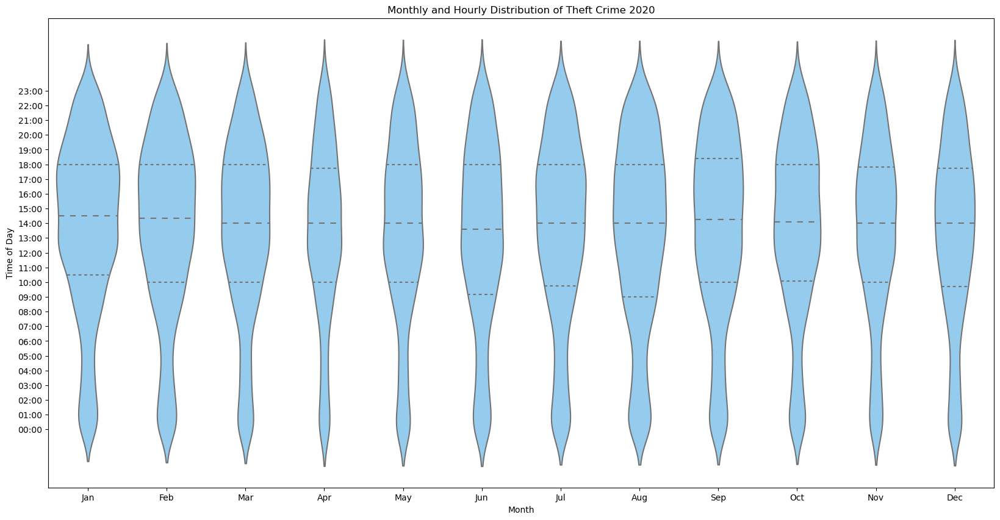

In [4]:
# Filter data for the 'Theft' crime type
theft_data = data[data['Primary Type'] == 'THEFT']
theft_data

# Convert the 'Date' column to a datetime object
theft_data['Date'] = pd.to_datetime(theft_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
theft_data['Month'] = theft_data['Date'].dt.strftime('%b')
theft_data['Time'] = theft_data['Date'].dt.hour * 60 + theft_data['Date'].dt.minute



# Map months to seasons
season_mapping = {
    'Jan': 'Winter', 'Feb': 'Winter', 'Mar': 'Winter',
    'Apr': 'Winter', 'May': 'Summer', 'Jun': 'Summer',
    'Jul': 'Summer', 'Aug': 'Summer', 'Sep': 'Summer',
    'Oct': 'Summer', 'Nov': 'Winter', 'Dec': 'Winter'
}
theft_data['Season'] = theft_data['Month'].map(season_mapping)

# Define the order of months for proper alignment
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# color = ["lightblue", "lightpink"]
# palette = sns.set_palette(sns.color_palette(color))
colors = {
    'Winter': 'lightblue',
    'Summer': 'lightpink',
}


# Create the violin plot
plt.figure(figsize=(20, 10))
ax = sns.violinplot(data=theft_data, x='Month', y='Time', color="lightskyblue", 
                    inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Theft Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])


# Move the legend to the right
# plt.legend(title="Season", loc='upper left', bbox_to_anchor=(1.0, 1.0))

plt.show()

# MOTOR VEHICLE THEFT

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\1005780380.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  theft_data['Date'] = pd.to_datetime(theft_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\1005780380.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  theft_data['Month'] = theft_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\1005780380.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice

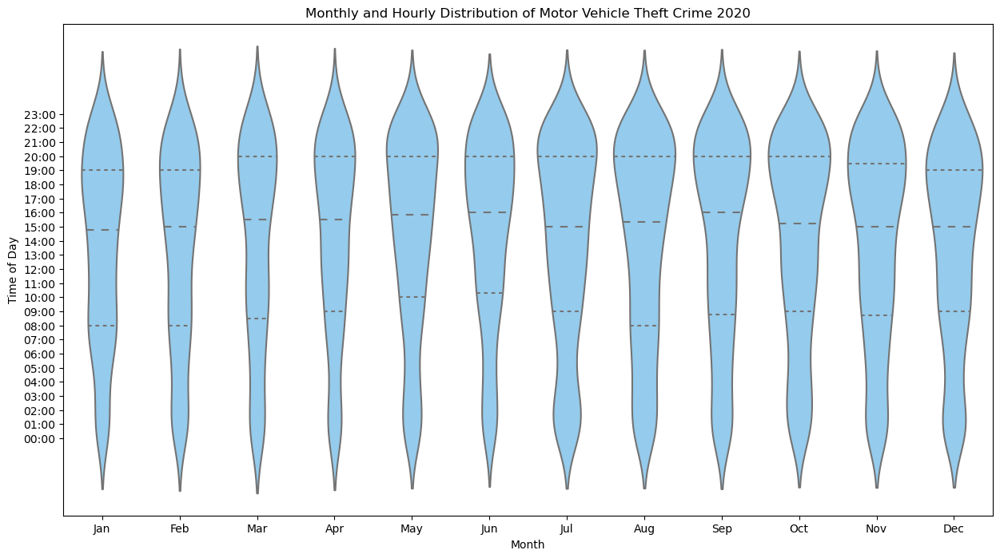

In [5]:
theft_data = data[data['Primary Type'] == 'MOTOR VEHICLE THEFT']

# Convert the 'Date' column to a datetime object
theft_data['Date'] = pd.to_datetime(theft_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
theft_data['Month'] = theft_data['Date'].dt.strftime('%b')
theft_data['Time'] = theft_data['Date'].dt.hour * 60 + theft_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=theft_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Motor Vehicle Theft Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# HOMICIDE

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\4101364389.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HOMICIDE_data['Date'] = pd.to_datetime(HOMICIDE_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\4101364389.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  HOMICIDE_data['Month'] = HOMICIDE_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\4101364389.py:10: SettingWithCopyWarning: 
A value is trying to be set on a co

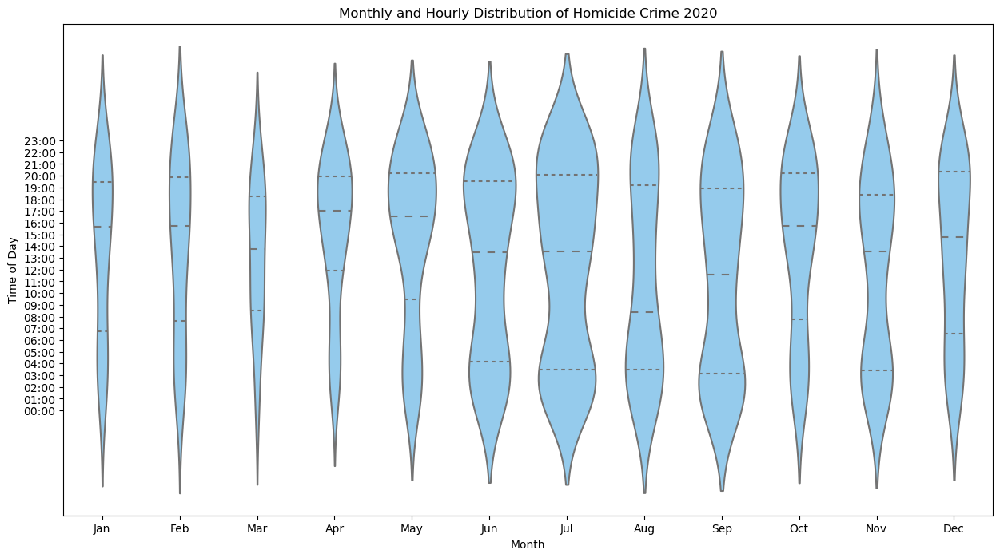

In [6]:
# Filter data for the 'HOMICIDE' crime type
HOMICIDE_data = data[data['Primary Type'] == 'HOMICIDE']


# Convert the 'Date' column to a datetime object
HOMICIDE_data['Date'] = pd.to_datetime(HOMICIDE_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
HOMICIDE_data['Month'] = HOMICIDE_data['Date'].dt.strftime('%b')
HOMICIDE_data['Time'] = HOMICIDE_data['Date'].dt.hour * 60 + HOMICIDE_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=HOMICIDE_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Homicide Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# CRIMINAL SEXUAL ASSAULT and SEX OFFENSE

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\3359491448.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\3359491448.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\3359491448.py:10: SettingWithCopyWarning: 
A value is trying to be set on a co

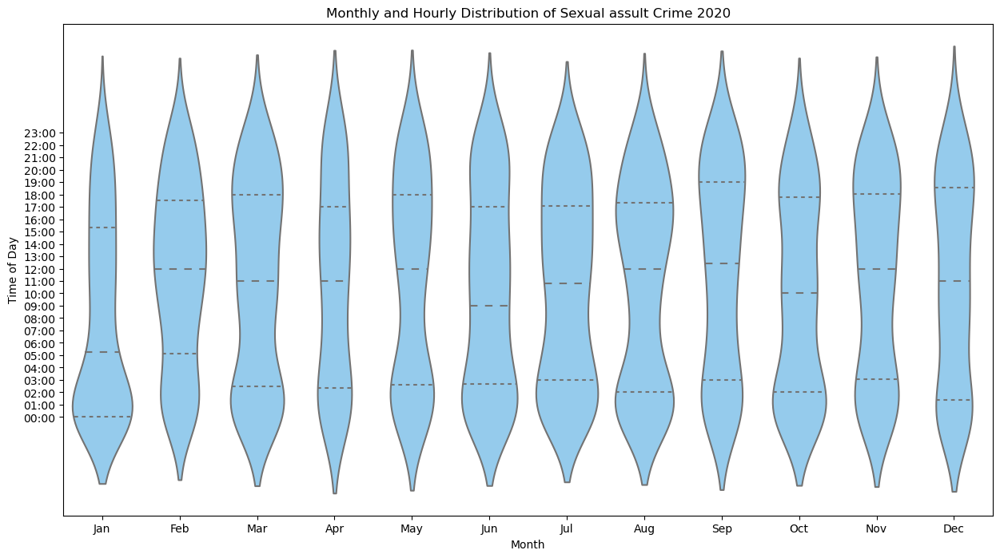

In [7]:
# Filter data for the 'HOMICIDE' crime type
criminal_data = data[(data['Primary Type'] == 'CRIMINAL SEXUAL ASSAULT') | (data['Primary Type'] == 'SEX OFFENSE')]


# Convert the 'Date' column to a datetime object
criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
criminal_data['Time'] = criminal_data['Date'].dt.hour * 60 + criminal_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Sexual assult Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# ROBBERY

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\686875792.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\686875792.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\686875792.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy 

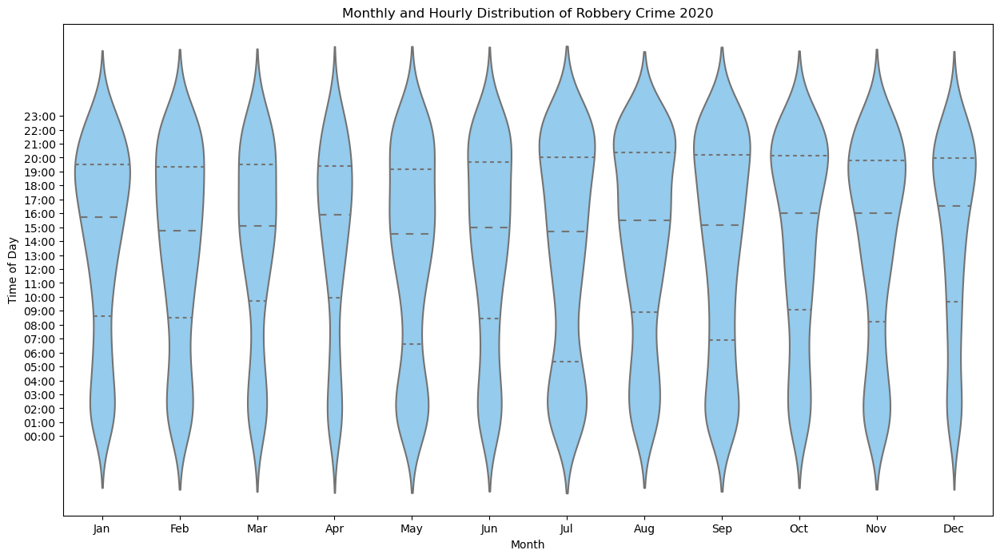

In [8]:
# Filter data for the 'HOMICIDE' crime type
criminal_data = data[(data['Primary Type'] == 'ROBBERY')]


# Convert the 'Date' column to a datetime object
criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
criminal_data['Time'] = criminal_data['Date'].dt.hour * 60 + criminal_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Robbery Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# BATTERY

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\1918748725.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\1918748725.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\1918748725.py:10: SettingWithCopyWarning: 
A value is trying to be set on a co

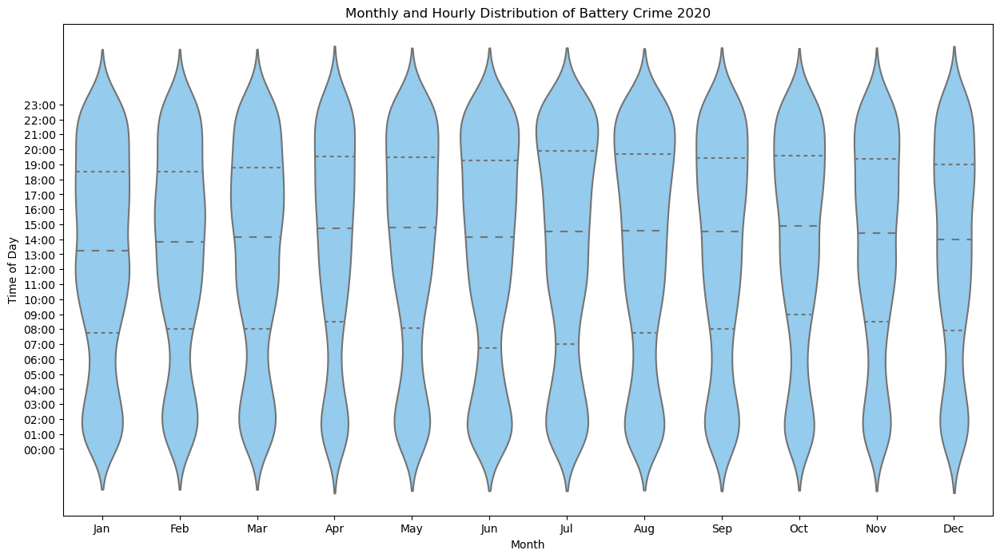

In [9]:
# Filter data for the 'HOMICIDE' crime type
criminal_data = data[(data['Primary Type'] == 'BATTERY')]


# Convert the 'Date' column to a datetime object
criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
criminal_data['Time'] = criminal_data['Date'].dt.hour * 60 + criminal_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Battery Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# BURGLARY

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\2045471473.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\2045471473.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\2045471473.py:10: SettingWithCopyWarning: 
A value is trying to be set on a co

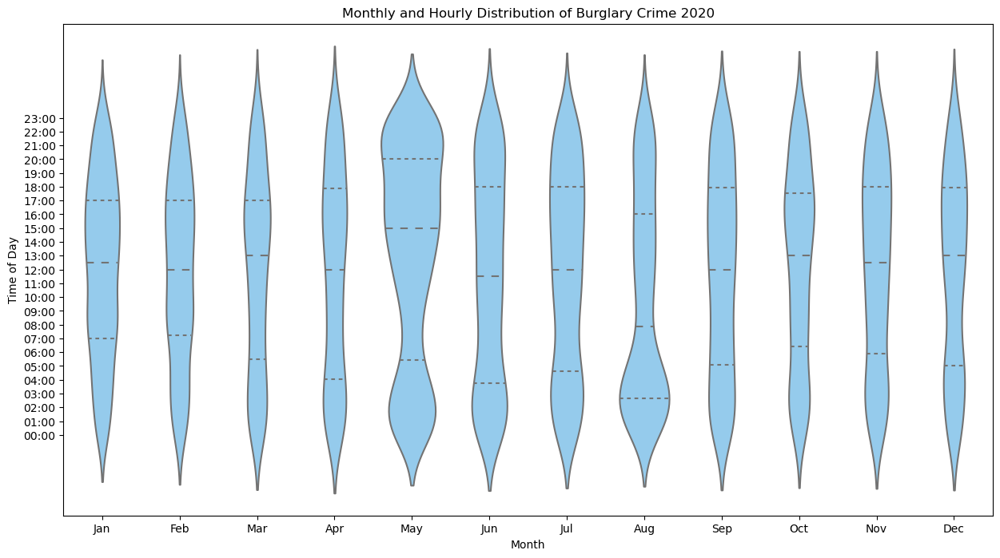

In [10]:
# Filter data for the 'HOMICIDE' crime type
criminal_data = data[(data['Primary Type'] == 'BURGLARY')]


# Convert the 'Date' column to a datetime object
criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
criminal_data['Time'] = criminal_data['Date'].dt.hour * 60 + criminal_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Burglary Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# KIDNAPPING

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\2898880424.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\2898880424.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\2898880424.py:10: SettingWithCopyWarning: 
A value is trying to be set on a co

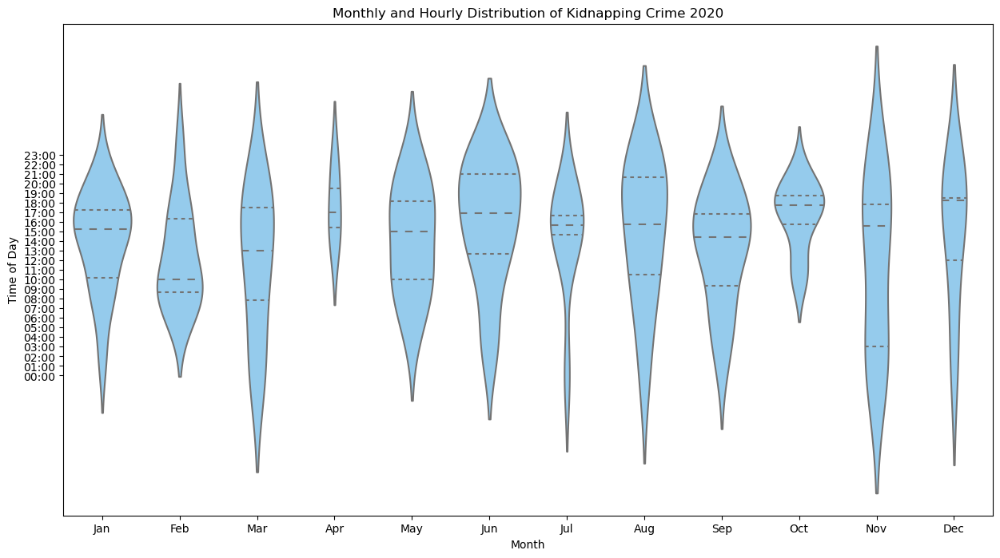

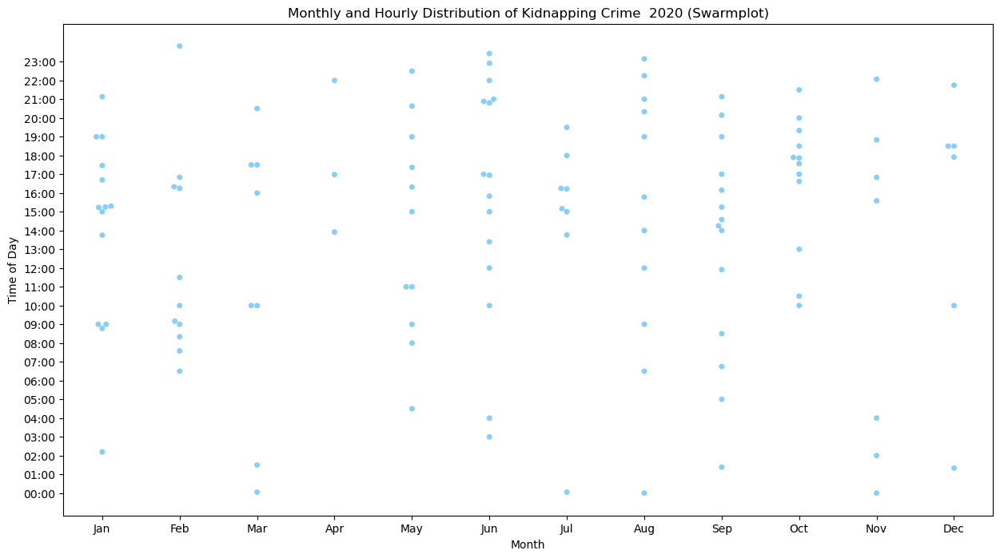

In [11]:
# Filter data for the 'HOMICIDE' crime type
criminal_data = data[(data['Primary Type'] == 'KIDNAPPING')]


# Convert the 'Date' column to a datetime object
criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
criminal_data['Time'] = criminal_data['Date'].dt.hour * 60 + criminal_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Kidnapping Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# Create the swarmplot
plt.figure(figsize=(15, 8))
sns.swarmplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", size=5)
plt.title('Monthly and Hourly Distribution of Kidnapping Crime  2020 (Swarmplot)')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# HUMAN TRAFFICKING

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\484316492.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\484316492.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\484316492.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy 

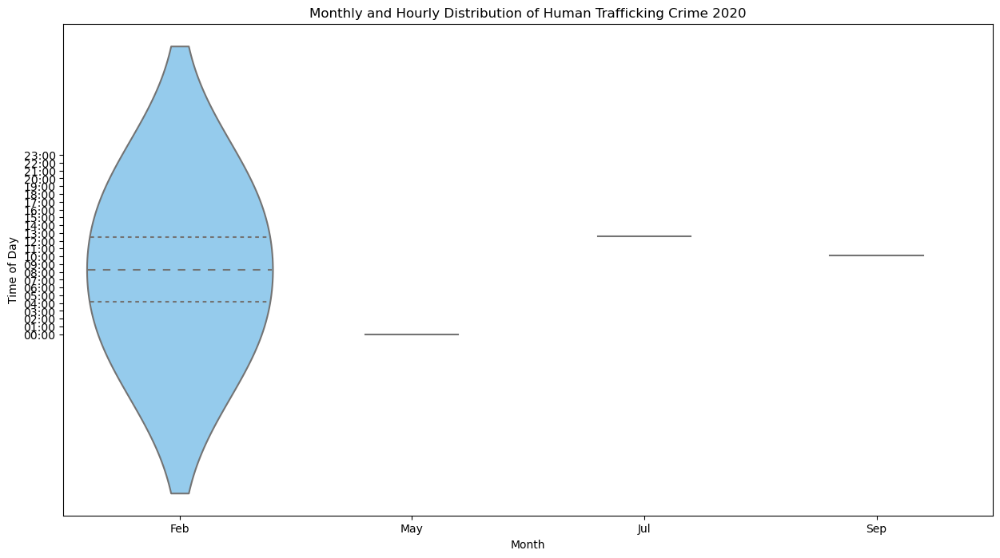

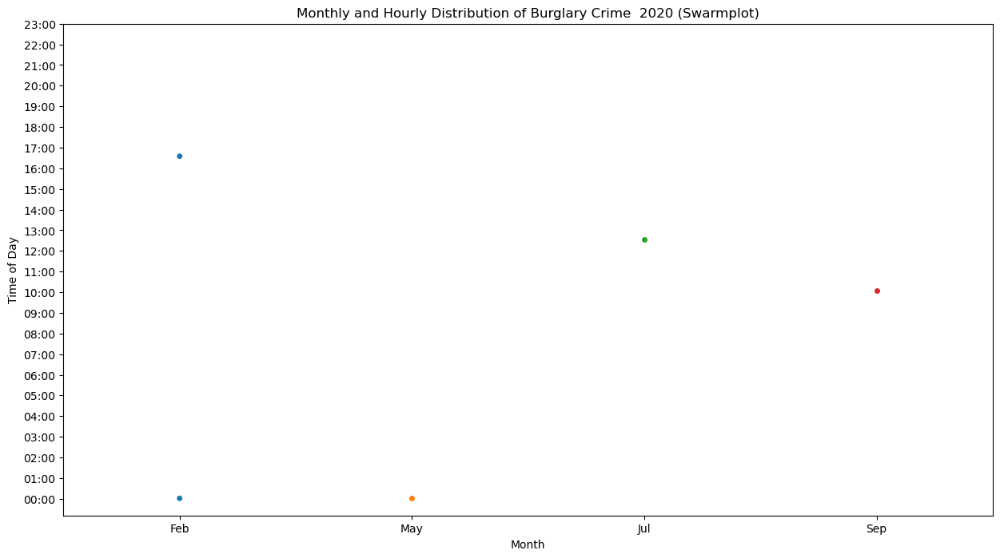

In [12]:
# Filter data for the 'HOMICIDE' crime type
criminal_data = data[(data['Primary Type'] == 'HUMAN TRAFFICKING')]


# Convert the 'Date' column to a datetime object
criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
criminal_data['Time'] = criminal_data['Date'].dt.hour * 60 + criminal_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Human Trafficking Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# Create the swarmplot
plt.figure(figsize=(15, 8))
sns.swarmplot(data=criminal_data, x='Month', y='Time', size=5)
plt.title('Monthly and Hourly Distribution of Burglary Crime  2020 (Swarmplot)')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# WEAPONS VIOLATION

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\3414274987.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\3414274987.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\3414274987.py:10: SettingWithCopyWarning: 
A value is trying to be set on a co

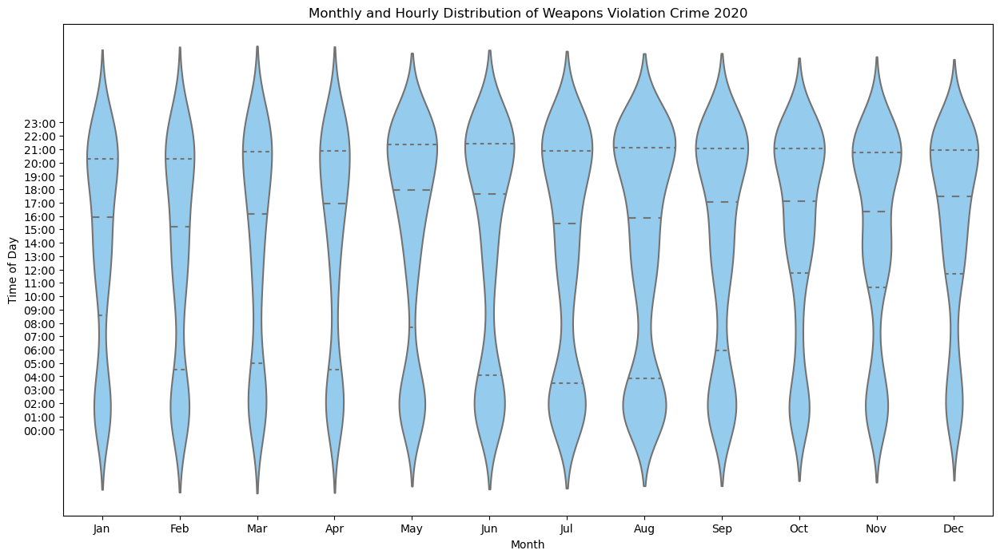

In [13]:
# Filter data for the 'HOMICIDE' crime type
criminal_data = data[(data['Primary Type'] == 'WEAPONS VIOLATION')]


# Convert the 'Date' column to a datetime object
criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
criminal_data['Time'] = criminal_data['Date'].dt.hour * 60 + criminal_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Weapons Violation Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

# STALKING

C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\2781734629.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\2781734629.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
C:\Users\sanja\AppData\Local\Temp\ipykernel_10320\2781734629.py:10: SettingWithCopyWarning: 
A value is trying to be set on a co

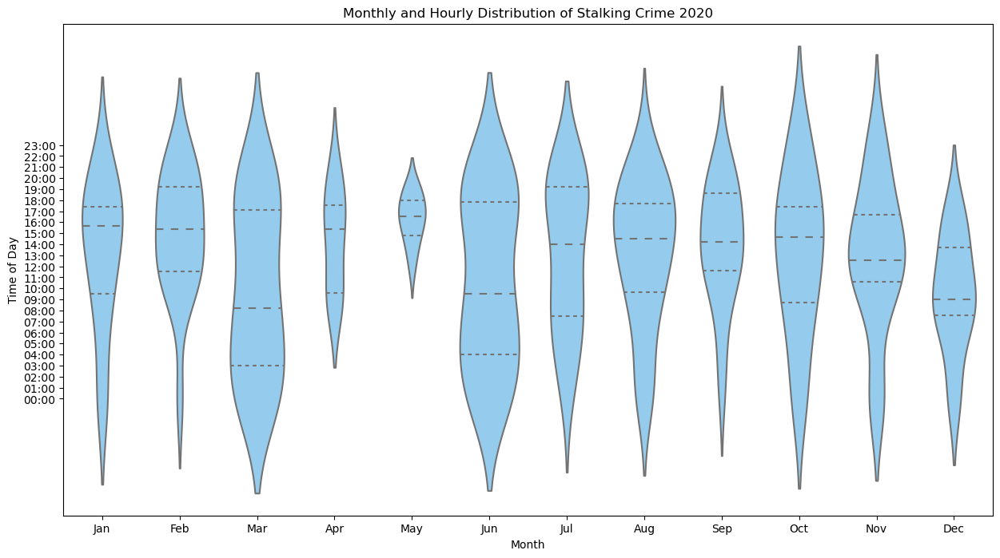

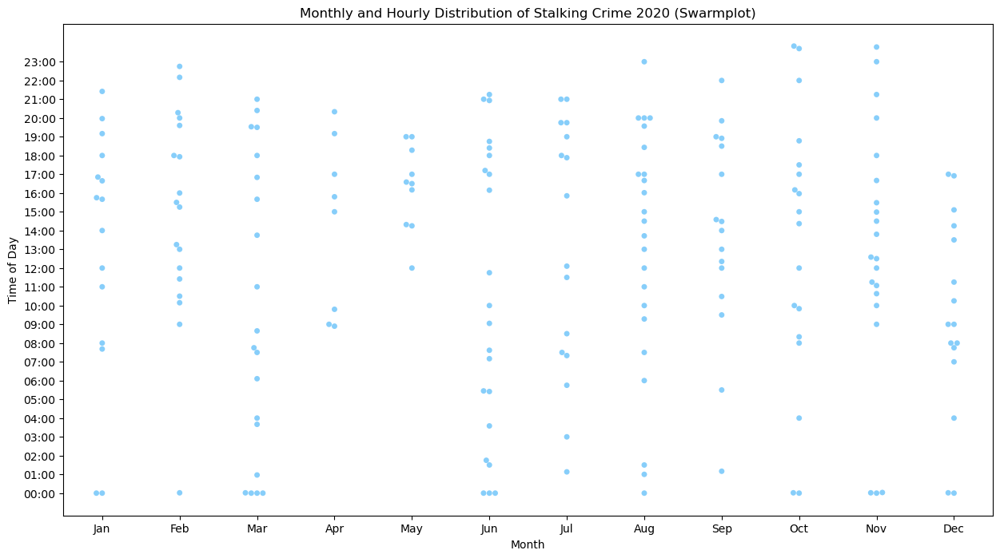

In [14]:
# Filter data for the 'HOMICIDE' crime type
criminal_data = data[(data['Primary Type'] == 'STALKING')]


# Convert the 'Date' column to a datetime object
criminal_data['Date'] = pd.to_datetime(criminal_data['Date'], format='%m/%d/%Y %I:%M:%S %p')

# Extract the month and time as minutes since midnight
criminal_data['Month'] = criminal_data['Date'].dt.strftime('%b')
criminal_data['Time'] = criminal_data['Date'].dt.hour * 60 + criminal_data['Date'].dt.minute

# Create the violin plot
plt.figure(figsize=(15, 8))
sns.violinplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", inner='quart', scale='count')
plt.title('Monthly and Hourly Distribution of Stalking Crime 2020')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()


# Create the swarmplot
plt.figure(figsize=(15, 8))
sns.swarmplot(data=criminal_data, x='Month', y='Time', color="lightskyblue", size=5)
plt.title('Monthly and Hourly Distribution of Stalking Crime 2020 (Swarmplot)')
plt.xlabel('Month')
plt.ylabel('Time of Day')
plt.yticks(range(0, 1440, 60), [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, 60)])
plt.show()

### **Observation**

Following the analysis of crime types across different times of the day and months:

- **COVID-19 Impact:** The analysis revealed a higher incidence of motor vehicle crimes and robberies during 2020, aligning with our hypothesis and suggesting the pandemic's influence on crime trends.

- **Burglary Spike:** An escalating trend in burglary rates from 2020 to 2022 was observed, necessitating further investigation into the underlying causes for effective prevention strategies.

- **Temporal Patterns:** Different crimes displayed distinct temporal patterns. For instance: 
    + Theft crimes peaked from noon to midnight, challenging assumptions related to reduced daylight hours and increased opportunities.
    + Motor vehicle thefts surged after 6 pm to midnight, consistent with expected opportunistic crime patterns during darker hours.
    + Homicides were prevalent from late afternoon to early morning, emphasizing the need for targeted law enforcement efforts during these hours.
    + Sexual harassment incidents occurred throughout the day, highlighting the necessity for comprehensive prevention strategies.
    + Robberies increased after dark, indicating the influence of low-light conditions on the occurrence of these crimes.
    

The analysis confirmed the impact of external factors, notably the COVID-19 pandemic, on certain crime types like motor vehicle crimes and robberies. However, it also highlighted distinct temporal patterns across various crime categories, emphasizing the importance of tailored law enforcement strategies based on time-of-day trends for effective crime prevention and control.

Further investigations into crime spikes, especially the escalating trend in burglary rates, are essential for devising targeted interventions and ensuring community safety. This comprehensive understanding of temporal crime trends could guide law enforcement agencies in allocating resources efficiently and implementing proactive measures to address crime hotspots.



### Q- Which districts have reported the highest number of different crime types, and can we identify any notable patterns or trends in the distribution of crime types within these districts?

We hypothesized that specific districts in Chicago would exhibit varying crime rates, and within these districts, certain wards might experience distinct crime trends. Additionally, there might be observable fluctuations in crime incidents over the years.

In [29]:
crime_df = pd.read_csv('Chicago_Crime_2020.csv')
crime_df['City']="Chicago"
treemap_data=crime_df.groupby(['City','District','Ward']).size().reset_index(name='Crime_Count').sort_values(by='Crime_Count', ascending=False)


import plotly.io as pio
pio.renderers.default = 'iframe_connected'

import plotly.express as px
# Treemap data
treemap_data = crime_df.groupby(['City', 'District', 'Ward']).size().reset_index(name='Crime_Count').sort_values(by='Crime_Count', ascending=False)
# customizing District and Ward names for readibility
treemap_data['District']=treemap_data['District'].apply(lambda x: f'D-{x}' )
treemap_data['Ward']=treemap_data['Ward'].apply(lambda x: f'D-{x}' )

treemap_data


# Create the treemap
fig = px.treemap(treemap_data,
                 path=[px.Constant("City"), 'District', 'Ward'],
                 values='Crime_Count',
                 color='Crime_Count',
                 color_continuous_scale='Inferno',
                 template='plotly_white',
                 title='Breakdown of districts that have high crime types - 2020')


# Show the treemap
# fig.show(renderer="colab")
# fig.show()
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

![](Images/Breakdown_District2020.png)

In [30]:
crime_df = pd.read_csv('Chicago_Crime_2021.csv')
crime_df['City']="Chicago"
treemap_data=crime_df.groupby(['City','District','Ward']).size().reset_index(name='Crime_Count').sort_values(by='Crime_Count', ascending=False)

# Treemap data
treemap_data = crime_df.groupby(['City', 'District', 'Ward']).size().reset_index(name='Crime_Count').sort_values(by='Crime_Count', ascending=False)
# customizing District and Ward names for readibility
treemap_data['District']=treemap_data['District'].apply(lambda x: f'D-{x}' )
treemap_data['Ward']=treemap_data['Ward'].apply(lambda x: f'D-{x}' )

treemap_data


# Create the treemap
fig = px.treemap(treemap_data,
                 path=[px.Constant("City"), 'District', 'Ward'],
                 values='Crime_Count',
                 color='Crime_Count',
                 color_continuous_scale='Inferno',
                 template='plotly_white',
                 title='Breakdown of districts that have high crime types - 2021')


# Show the treemap
# fig.show(renderer="colab")
# fig.show()
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()


![](Images/Breakdown2021.png)

In [31]:
crime_df = pd.read_csv('Chicago_Crime_2022.csv')
crime_df['City']="Chicago"
treemap_data=crime_df.groupby(['City','District','Ward']).size().reset_index(name='Crime_Count').sort_values(by='Crime_Count', ascending=False)

# Treemap data
treemap_data = crime_df.groupby(['City', 'District', 'Ward']).size().reset_index(name='Crime_Count').sort_values(by='Crime_Count', ascending=False)
# customizing District and Ward names for readibility
treemap_data['District']=treemap_data['District'].apply(lambda x: f'D-{x}' )
treemap_data['Ward']=treemap_data['Ward'].apply(lambda x: f'D-{x}' )

treemap_data


# Create the treemap
fig = px.treemap(treemap_data,
                 path=[px.Constant("City"), 'District', 'Ward'],
                 values='Crime_Count',
                 color='Crime_Count',
                 color_continuous_scale='Inferno',
                 template='plotly_white',
                 title='Breakdown of districts that have high crime types - 2022')


# Show the treemap
# fig.show(renderer="colab")
# fig.show()
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

![](Images/Breakdown2022.png)

### Observation

Following the analysis of crime rates in Chicago districts and wards:

- **High-Crime Districts:** Districts 11, 8, 6, 4, 12, and 7 emerged with the highest reported crime rates.

- **District 11:** Ward 28 within District 11 experienced a considerable volume of crimes in 2020. However, there was a noticeable decline in crime incidents within this ward in 2022, indicating positive progress for law enforcement efforts.

- **District 8:** Ward 15 displayed a significant number of reported crimes.

- **District 6:** Ward 21 in District 6 exhibited elevated crime rates.


The analysis affirmed the hypothesis by identifying specific districts and wards in Chicago with higher reported crime rates. Notably, certain areas experienced fluctuations in crime incidents over the years, showcasing both positive developments and persisting challenges for law enforcement.

The substantial decline in crime incidents within Ward 28 of District 11 between 2020 and 2022 is promising, indicating potential success in law enforcement strategies or community interventions. However, further investigations are needed to understand the factors influencing these fluctuations in crime rates within specific districts and wards for more effective crime prevention and mitigation strategies.

### Q: How does the occurrence of crime types hierarchically distribute across different District and Location Descriptions?

We hypothesized that different districts in Chicago would exhibit varying crime types across different locations within those districts. We expected certain districts to emphasize specific crime categories, potentially demonstrating distinct patterns in crime distribution.

In [32]:
#Sunburst Data
crime_df = pd.read_csv('Chicago_Crime_2020.csv')
district_df=crime_df[crime_df['District'].isin([11, 6, 8, 4, 7]) &
                     crime_df['Location Description'].isin(['STREET', 'RESIDENCE','APARTMENT', 'SIDEWALK','PARKING LOT/GARAGE(NON.RESID.)', 'ALLEY', 'RESIDENTIAL YARD (FRONT/BACK)']) &
                     crime_df['Primary Type'].isin(['THEFT', 'BATTERY', 'CRIMINAL DAMAGE', 'NARCOTICS','ASSAULT','BURGLARY ', 'DECEPTIVE PRACTICE','MOTOR VEHICLE THEFT','ROBBERY '])]
sunburst_data=district_df.groupby(['District', 'Location Description', 'Primary Type']).size().reset_index(name='Crime_Count').sort_values(by='Crime_Count', ascending=False)


# Create the Sunburst
fig = px.sunburst(
    sunburst_data,
    path=['District', 'Location Description', 'Primary Type'],
    values='Crime_Count',
    color='Crime_Count',
    color_continuous_scale='Viridis',
    title='Hierarchical Breakdown of Crime Types by Location Description - 2020'
)

fig.update_layout(margin=dict(l=0, r=0, b=0, t=40))
#Show the Sunburst
fig.show()

![](Images/Hierarchical2020.png)

In [33]:
#Sunburst Data
crime_df = pd.read_csv('Chicago_Crime_2021.csv')
district_df=crime_df[crime_df['District'].isin([11, 6, 8, 4, 12]) &
                     crime_df['Location Description'].isin(['STREET', 'RESIDENCE','APARTMENT', 'SIDEWALK','PARKING LOT/GARAGE(NON.RESID.)', 'ALLEY', 'RESIDENTIAL YARD (FRONT/BACK)']) &
                     crime_df['Primary Type'].isin(['THEFT', 'BATTERY', 'CRIMINAL DAMAGE', 'NARCOTICS','ASSAULT','BURGLARY ', 'DECEPTIVE PRACTICE','MOTOR VEHICLE THEFT','ROBBERY '])]
sunburst_data=district_df.groupby(['District', 'Location Description', 'Primary Type']).size().reset_index(name='Crime_Count').sort_values(by='Crime_Count', ascending=False)


# Create the Sunburst
fig = px.sunburst(
    sunburst_data,
    path=['District', 'Location Description', 'Primary Type'],
    values='Crime_Count',
    color='Crime_Count',
    color_continuous_scale='Viridis',
    title='Hierarchical Breakdown of Crime Types by Location Description - 2021'
)

fig.update_layout(margin=dict(l=0, r=0, b=0, t=40))
#Show the Sunburst
fig.show()

![](Images/Hierarchical2021.png)

In [34]:
#Sunburst Data
crime_df = pd.read_csv('Chicago_Crime_2022.csv')
district_df=crime_df[crime_df['District'].isin([8, 6, 12, 4, 11]) &
                     crime_df['Location Description'].isin(['STREET', 'RESIDENCE','APARTMENT', 'SIDEWALK','PARKING LOT/GARAGE(NON.RESID.)', 'ALLEY', 'RESIDENTIAL YARD (FRONT/BACK)']) &
                     crime_df['Primary Type'].isin(['THEFT', 'BATTERY', 'CRIMINAL DAMAGE', 'NARCOTICS','ASSAULT','BURGLARY ', 'DECEPTIVE PRACTICE','MOTOR VEHICLE THEFT','ROBBERY '])]
sunburst_data=district_df.groupby(['District', 'Location Description', 'Primary Type']).size().reset_index(name='Crime_Count').sort_values(by='Crime_Count', ascending=False)


# Create the Sunburst
fig = px.sunburst(
    sunburst_data,
    path=['District', 'Location Description', 'Primary Type'],
    values='Crime_Count',
    color='Crime_Count',
    color_continuous_scale='Viridis',
    title='Hierarchical Breakdown of Crime Types by Location Description - 2022'
)

fig.update_layout(margin=dict(l=0, r=0, b=0, t=40))
#Show the Sunburst
fig.show()

![](Images/Hierarchical2022.png)

### **Observation**
Following the analysis of crime distribution across various districts and locations:

- **District 11 - Narcotics Emphasis:** Crimes are notably concentrated on SIDEWALKS & STREETS within District 11, with NARCOTICS being the primary crime type, suggesting a focus on drug-related offenses in this area.

- **District 8 - Property-Related Crimes:** High-crime locations in District 8 include STREETS and RESIDENCES, where THEFT and CRIMINAL DAMAGE are prevalent, signifying a prevalence of property-related offenses.

- **District 4 - Property Incidents:** Similar to District 8, District 4 experiences elevated crime rates in STREETS and RESIDENCES, primarily featuring THEFT and CRIMINAL DAMAGE, indicating a concentration of property-related offenses.

- **District 6 - Diverse Crime Profile:** District 6 showcases high-crime areas in STREETS and RESIDENCES, demonstrating a mix of property-related crimes (THEFT) and drug-related offenses (NARCOTICS).


The analysis affirmed our hypothesis by revealing distinct crime patterns across various Chicago districts and locations. Each district exhibits its unique crime profile, highlighting the prevalence of particular crime types in specific areas. The emphasis on narcotics-related offenses in District 11, property-related crimes in Districts 8 and 4, and the diverse range of crimes in District 6 underscore the significance of geographical locations in understanding prevalent crime types within Chicago districts.

### Q- How has the trend of arrests (arrested vs. not arrested) evolved over the years in the dataset, and are there any noticeable patterns or changes in this trend?

Our initial hypothesis anticipated a potential increase in the arrest rates over the years, assuming an improvement in law enforcement strategies and a subsequent decrease in crime rates. We expected to observe a consistent or increasing trend in the percentage of arrests from 2020 to 2021.

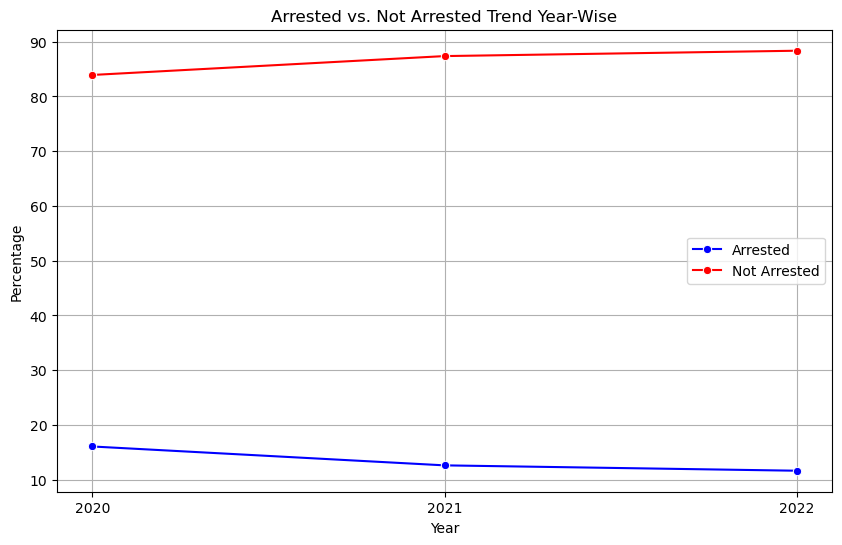

In [13]:
crime_df = pd.read_csv('Chicago_Crime_all.csv')

crime_df['Year'] = crime_df['Year'].astype(int)  # Convert 'Year' column to integers

crime_df['Arrested'] = np.where(crime_df['Arrest'] == True, 'Arrested', 'Not Arrested')
crime_df.drop(['Arrest'], axis=1, inplace=True)

# Calculate the percentage of arrests (arrested vs. not arrested) year-wise
arrested_percentage = (
    crime_df.groupby(['Year', 'Arrested']).size() / crime_df.groupby('Year').size()
) * 100
arrested_percentage = arrested_percentage.reset_index(name='Percentage')

# Filter the data for years 2020, 2021, and 2022
years_of_interest = [2020, 2021, 2022]
arrested_percentage = arrested_percentage[arrested_percentage['Year'].isin(years_of_interest)]

# Create a figure for the line plot
plt.figure(figsize=(10, 6))

# Create line plots for arrested and not arrested cases
sns.lineplot(
    x='Year',
    y='Percentage',
    data=arrested_percentage[arrested_percentage['Arrested'] == 'Arrested'],
    marker='o',
    label='Arrested',
    color='b'
)

sns.lineplot(
    x='Year',
    y='Percentage',
    data=arrested_percentage[arrested_percentage['Arrested'] == 'Not Arrested'],
    marker='o',
    label='Not Arrested',
    color='r'
)

# Customize the plot
plt.title('Arrested vs. Not Arrested Trend Year-Wise')
plt.xlabel('Year')
plt.ylabel('Percentage')
plt.grid(True)
plt.legend()

# Set x-axis ticks to display only integer years
plt.xticks(ticks=years_of_interest)

# Show the line plot
plt.show()

#### **Observation**

Upon analyzing the trends in arrest rates over the years in the Chicago crime dataset:

- **2020 to 2021 Arrest Rate Decline:** Surprisingly, there is a consistent decrease in the percentage of arrests from 2020 to 2021. This declining trend contradicts the expected increase and questions the efficacy of law enforcement efforts during this period.

- **Fluctuating Arrest Percentages:** The fluctuations in arrest percentages suggest changing dynamics in criminal activity or potential shifts in law enforcement strategies. These variations might influence the overall trends in crime rates across different years.


The analysis contradicted our initial hypothesis by revealing a consistent decline in arrest rates from 2020 to 2021, contrary to the expected increase. This unexpected trend raises concerns about the effectiveness of law enforcement efforts during this period and prompts further investigation into the factors contributing to the decreasing arrest percentages despite potential changes in crime rates. The fluctuating arrest percentages over the years indicate a dynamic relationship between law enforcement actions and criminal activities, warranting deeper exploration and assessment of law enforcement strategies and their impact on crime rates.

### ML 1: Arrest Prediction Using Decision Tree Classifier, Cross Validation Metrics for Decision Tree, and Gaussian Model

In [36]:

from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier,export_graphviz
from sklearn.preprocessing import LabelEncoder
import sklearn.metrics as metrics
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from sklearn.naive_bayes import GaussianNB
from sklearn import svm

In [37]:
crime_data=pd.read_csv("Chicago_Crime_all.csv")

In [38]:
crime_data = crime_data.dropna()
crime_data.isnull().sum().sum()
keep_cols = ['Arrest','Primary Type','Domestic','District','Location Description','X Coordinate','Y Coordinate']
crime_data = crime_data[keep_cols].reset_index()
crime_data.head()

,index,Arrest,Primary Type,Domestic,District,Location Description,X Coordinate,Y Coordinate
0,0,False,CRIMINAL SEXUAL ASSAULT,False,8,APARTMENT,1143770.0,1874726.0
1,1,False,CRIMINAL SEXUAL ASSAULT,True,11,RESIDENCE,1146135.0,1901073.0
2,2,False,DECEPTIVE PRACTICE,False,8,RESIDENCE,1139251.0,1869313.0
3,3,False,OFFENSE INVOLVING CHILDREN,True,3,APARTMENT,1178399.0,1857704.0
4,4,False,OFFENSE INVOLVING CHILDREN,True,12,RESIDENCE,1167593.0,1894183.0


In [40]:
percentage_intances = crime_data.groupby('Arrest').size() * 100 / len(crime_data)
print(percentage_intances)
print("------------------")
print("Percentage Positive Instance = {}\nPercentage Negative Instance = {} ".format(percentage_intances[1],percentage_intances[0]))

Arrest
False    86.652053
True     13.347947
dtype: float64
------------------
Percentage Positive Instance = 13.347946738800923
Percentage Negative Instance = 86.65205326119907 


In [41]:
len(crime_data['Location Description'].unique().tolist())

177

In [42]:
X=crime_data.drop('Arrest',axis=1)
features = list(X.columns)
y = crime_data["Arrest"]

In [43]:
X.head()

,index,Primary Type,Domestic,District,Location Description,X Coordinate,Y Coordinate
0,0,CRIMINAL SEXUAL ASSAULT,False,8,APARTMENT,1143770.0,1874726.0
1,1,CRIMINAL SEXUAL ASSAULT,True,11,RESIDENCE,1146135.0,1901073.0
2,2,DECEPTIVE PRACTICE,False,8,RESIDENCE,1139251.0,1869313.0
3,3,OFFENSE INVOLVING CHILDREN,True,3,APARTMENT,1178399.0,1857704.0
4,4,OFFENSE INVOLVING CHILDREN,True,12,RESIDENCE,1167593.0,1894183.0


In [44]:
labelencoder = LabelEncoder()
X['Primary Type']=X['Primary Type'].astype("category").cat.codes
X['Location Description']=X['Location Description'].astype("category").cat.codes

In [45]:
scaler = preprocessing.MinMaxScaler()
X[['X Coordinate', 'Y Coordinate']] = scaler.fit_transform(X[['X Coordinate', 'Y Coordinate']])

In [46]:
X.head()

,index,Primary Type,Domestic,District,Location Description,X Coordinate,Y Coordinate
0,0,7,False,8,17,0.949093,0.960646
1,1,7,True,11,132,0.951055,0.974146
2,2,9,False,8,132,0.945343,0.957872
3,3,21,True,3,17,0.977828,0.951923
4,4,21,True,12,132,0.968861,0.970616


In [47]:
dt_clf = DecisionTreeClassifier()
dt_clf.fit(X,y)
predicted = dt_clf.predict(X[features])
recall_score = metrics.recall_score(crime_data['Arrest'], predicted)
precision_score = metrics.precision_score(crime_data['Arrest'], predicted)
accuracy_score = metrics.accuracy_score(crime_data['Arrest'], predicted)
print("Training Accuracy = {} Precision = {} Recall = {}".format(accuracy_score,precision_score,recall_score))

Training Accuracy = 1.0 Precision = 1.0 Recall = 1.0


In [48]:
for depth in range(1,10):
    tree_clf = DecisionTreeClassifier(max_depth=depth, random_state=0)
    if tree_clf.fit(X,y).tree_.max_depth < depth:
        break
    score = np.mean(cross_val_score(tree_clf, X, y,scoring='accuracy', cv=10, n_jobs=1))
    print("Depth: %i Accuracy: %.3f" % (depth,score))

Depth: 1 Accuracy: 0.877
Depth: 2 Accuracy: 0.806
Depth: 3 Accuracy: 0.804
Depth: 4 Accuracy: 0.824
Depth: 5 Accuracy: 0.822
Depth: 6 Accuracy: 0.822
Depth: 7 Accuracy: 0.801
Depth: 8 Accuracy: 0.666
Depth: 9 Accuracy: 0.628


In [49]:
dt_clf = DecisionTreeClassifier(max_depth=3)
dt_clf.fit(X,y)
predicted = dt_clf.predict(X[features])
dt_recall = metrics.recall_score(crime_data['Arrest'], predicted)
dt_precision = metrics.precision_score(crime_data['Arrest'], predicted)
dt_accuracy= metrics.accuracy_score(crime_data['Arrest'], predicted)
print("Accuracy for DT =",dt_accuracy)
print("Precision for DT =",dt_precision)
print("Recall for DT =",dt_precision)

Accuracy for DT = 0.8789310449362218
Precision for DT = 0.6770459081836327
Recall for DT = 0.6770459081836327


In [50]:
importances=dt_clf.feature_importances_
indices = np.argsort(importances)[::-1]
# Print the feature ranking
print("Feature ranking:")
# We have taken the top 5 feature 
print("The main features used for classification")
print(X.columns[indices[:5]])
print("Top main feature is",X.columns[indices[:1]][0])

Feature ranking:
The main features used for classification
Index(['Primary Type', 'Location Description', 'Y Coordinate', 'District',
       'X Coordinate'],
      dtype='object')
Top main feature is Primary Type


In [51]:
# Applying 10 fold cross validation
dt_cv_accuracy = cross_val_score(dt_clf, X, y, cv=10).mean()
dt_cv_precision= cross_val_score(dt_clf, X, y, cv=10, scoring='precision').mean()
dt_cv_recall = cross_val_score(dt_clf, X, y, cv=10, scoring='recall').mean()
print("Cross Validation Accuracy DT:", dt_cv_accuracy)
print("Cross Validation Recall DT:", dt_cv_precision)
print("Cross Validation Precision DT:", dt_cv_recall)

C:\Users\sanja\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



Cross Validation Accuracy DT: 0.8042633455200672
Cross Validation Recall DT: 0.558746036274412
Cross Validation Precision DT: 0.25405310971348705


In [52]:
# Using GaussianNB
gaussian_clf = GaussianNB()
gaussian_clf.fit(X, y)

# Applying 10 fold cross validation
gaussian_accuracy = cross_val_score(gaussian_clf, X, y, cv=10).mean()
gaussian_precision= cross_val_score(gaussian_clf, X, y, cv=10, scoring='precision').mean()
gaussian_recall = cross_val_score(gaussian_clf, X, y, cv=10, scoring='recall').mean()
print("Accuracy for gaussian :", gaussian_accuracy)
print("Recall for gaussian:", gaussian_recall)
print("Precision for gaussian:", gaussian_precision)

C:\Users\sanja\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\sanja\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\sanja\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\sanja\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\sanja\anaconda3\lib\site-pa

Accuracy for gaussian : 0.8665205326039258
Recall for gaussian: 0.0
Precision for gaussian: 0.0


#### **Observation**

From the observations of the model evaluations for the Decision Tree (DT) classifier and Gaussian model applied to the Chicago crime data from 2020-2022, several insights can be derived:

**Decision Tree Classifier Performance:**

- Accuracy: The Decision Tree model exhibits relatively high accuracy of approximately 87.89%, implying a substantial proportion of correctly predicted arrests.
- Precision and Recall: The precision and recall values for the Decision Tree model are both around 67.70%. This indicates that when the model predicts an arrest, it is correct around 67.70% of the time, and it captures approximately 67.70% of actual arrests.
- **Feature Importance:** Primary Type, Location Description, Y Coordinate, District, and X Coordinate are identified as the main features used for classification, with Primary Type being the most significant among them.


**Cross Validation Metrics for Decision Tree:**

- Cross Validation Accuracy: The cross-validated accuracy for the Decision Tree is approximately 80.43%, showcasing the model's consistency in making accurate predictions across different subsets of the data during training.
- Cross Validation Recall and Precision: The cross-validated recall is around 55.87%, indicating the model's ability to capture about 55.87% of actual arrests, while the precision is approximately 25.41%, signifying that around 25.41% of predicted arrests are accurate.

**Gaussian Model Performance:**

- Accuracy for Gaussian Model: The Gaussian model demonstrates an accuracy of around 86.65%, suggesting a relatively high overall correctness in predicting arrests.
- Recall and Precision for Gaussian: However, the Gaussian model exhibits a recall and precision of 0.0, implying that the model fails to correctly identify any arrests, suggesting potential shortcomings or limitations in its performance.


Overall, the Decision Tree classifier shows promising predictive performance in identifying arrests within the Chicago crime data, primarily relying on features such as crime type, location description, and geographical coordinates. However, it's crucial to consider the trade-offs between precision and recall and the Gaussian model's inability to effectively predict arrests, which requires further investigation or alternative model approaches for improvement.







### ML Model 2 - Predict a crime is severe or non-severe based on several factors such as socioeconomic, crime types, primary location, districts using Random Forest and Baseline Model

In [1]:
import numpy as np 
import re
import pandas as pd 
import seaborn as sns
from datetime import datetime
import time
from time import sleep
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.pyplot as pltd
%matplotlib inline
plt.style.use('seaborn')
# import fbprophet
# print(fbprophet.__version__)
# from geopy.geocoders import Nominatim
from sklearn.cluster import AgglomerativeClustering as AC

In [19]:
crime_data=pd.read_csv("Chicago_Crime_all.csv")
poverty=pd.read_csv("poverty.csv")

In [49]:
severe_crime_list=["ARSON", "ASSAULT", "BATTERY", "CRIM SEXUAL ASSAULT", "CRIMINAL DAMAGE", "CRIMINAL TRESPASS", "HOMICIDE", "ROBBERY"]
crime_data["severe"]=np.where(crime_data['Primary Type'].isin(severe_crime_list), 1, 0)

datagb_crime=crime_data.groupby("Primary Type")["Primary Type"].count()
datagb_crime.sort_values(ascending=False, inplace=True)

In [50]:
crime_list=datagb_crime.index.values[0:25].tolist()
crime_data=crime_data[crime_data["Primary Type"].isin(crime_list)]

In [51]:
crime_data=crime_data[crime_data["Primary Type"]!="OTHER OFFENSE"]

In [52]:
severe_crime_list=["ARSON", "ASSAULT", "BATTERY", "CRIM SEXUAL ASSAULT", "CRIMINAL DAMAGE", "CRIMINAL TRESPASS", "HOMICIDE", "ROBBERY"]
crime_data["severe"]=np.where(crime_data['Primary Type'].isin(severe_crime_list), 1, 0)
crime_data.head(5)

,ID,Case Number,Date,Block,IUCR,Description,Location Description,Arrest,Domestic,Beat,...,District_24,District_25,District_31,District,Primary Type,Income,HARDSHIP INDEX,Under18_over64,Unemployed,House_below_poverty
0,12013828,JD191019,01/01/2020 12:00:00 AM,044XX S LAVERGNE AVE,0281,NON-AGGRAVATED,APARTMENT,False,False,814,...,0,0,0,8,CRIMINAL SEXUAL ASSAULT,19.3,56.0,19.3,11.3,2.6
1,12096663,JD286195,01/01/2020 12:00:00 AM,045XX W MAYPOLE AVE,0281,NON-AGGRAVATED,RESIDENCE,False,True,1113,...,0,0,0,11,CRIMINAL SEXUAL ASSAULT,24.5,26.0,24.5,25.8,9.4
2,12122015,JD316293,01/01/2020 12:00:00 AM,052XX S MAJOR AVE,1153,FINANCIAL IDENTITY THEFT OVER $ 300,RESIDENCE,False,False,811,...,0,0,0,8,DECEPTIVE PRACTICE,19.3,56.0,19.3,11.3,2.6
3,12107086,JD298302,01/01/2020 12:00:00 AM,071XX S MICHIGAN AVE,1582,CHILD PORNOGRAPHY,APARTMENT,False,True,323,...,0,0,0,3,OFFENSE INVOLVING CHILDREN,16.5,69.0,16.5,23.0,3.6
4,12048400,JD229636,01/01/2020 12:00:00 AM,013XX W 13TH ST,1752,AGGRAVATED CRIMINAL SEXUAL ABUSE BY FAMILY MEMBER,RESIDENCE,False,True,1233,...,0,0,0,12,OFFENSE INVOLVING CHILDREN,9.6,28.0,9.6,10.7,3.8


In [53]:
print(len(crime_data.groupby("Location Description")["Location Description"].count().index.values))

177


In [54]:
datagb_location=crime_data.groupby("Location Description")["Location Description"].count()
datagb_location.sort_values(ascending=False, inplace=True)
datagb_location.head(50)

Location Description
STREET                                        162196
APARTMENT                                     110518
RESIDENCE                                      86276
SIDEWALK                                       36290
PARKING LOT / GARAGE (NON RESIDENTIAL)         19803
SMALL RETAIL STORE                             17257
ALLEY                                          14073
RESTAURANT                                     11541
OTHER (SPECIFY)                                 9813
GAS STATION                                     9004
RESIDENCE - PORCH / HALLWAY                     8828
VEHICLE NON-COMMERCIAL                          8469
DEPARTMENT STORE                                7984
RESIDENCE - YARD (FRONT / BACK)                 7867
RESIDENCE - GARAGE                              7332
COMMERCIAL / BUSINESS OFFICE                    7013
GROCERY FOOD STORE                              6625
CONVENIENCE STORE                               4360
PARK PROPERTY            

In [55]:
location_list=datagb_location.index.values[0:25].tolist()
crime_data=crime_data[crime_data["Location Description"].isin(location_list)]
crime_data.shape

(558312, 84)

In [56]:
datagb_destrict=crime_data.groupby("District")["District"].count()
district_list=datagb_destrict.index.values[0:22].tolist()
crime_data=crime_data[crime_data["District"].isin(district_list)]

In [57]:
crime_data["District"]='D'+crime_data['District'].astype(str)

In [58]:
#make a dummy variable for district and primary type of crime
dummydf=pd.get_dummies(crime_data,columns=["Primary Type","District"])
#we will just make a copy here in case we need to use it in the future
dummydf=dummydf.join(crime_data[["District","Primary Type"]])
print(dummydf.shape)
dummydf.head(2)

(558298, 130)


,ID,Case Number,Date,Block,IUCR,Description,Location Description,Arrest,Domestic,Beat,...,District_D25,District_D3,District_D4,District_D5,District_D6,District_D7,District_D8,District_D9,District,Primary Type
0,12013828,JD191019,01/01/2020 12:00:00 AM,044XX S LAVERGNE AVE,0281,NON-AGGRAVATED,APARTMENT,False,False,814,...,0,0,0,0,0,0,1,0,D8,CRIMINAL SEXUAL ASSAULT
1,12096663,JD286195,01/01/2020 12:00:00 AM,045XX W MAYPOLE AVE,0281,NON-AGGRAVATED,RESIDENCE,False,True,1113,...,0,0,0,0,0,0,0,0,D11,CRIMINAL SEXUAL ASSAULT


In [60]:
from datetime import datetime

# Make a copy of the DataFrame
timedataf = dummydf.copy()

# Define the date format
date_format = '%m/%d/%Y %I:%M:%S %p'

# Convert 'Date' to datetime format
timedataf['Date'] = pd.to_datetime(timedataf['Date'], format=date_format)

# Extracting time in 24-hour format
timedataf["time_24hour"] = timedataf['Date'].dt.strftime("%H:%M")

# Extracting time block
timedataf["Timeblock"] = (timedataf['Date'].dt.hour // 3) * 3  # Create time blocks of 3 hours

# Extracting date without time
timedataf['Date_no_time'] = timedataf['Date'].dt.strftime("%Y%m%d")

# Extracting weekday and creating dummy columns
timedataf["Weekday"] = timedataf['Date'].dt.strftime("%A")
timedataf = pd.get_dummies(timedataf, columns=["Timeblock", "Weekday"])

timedataf.shape

(558298, 147)

In [61]:

# drop all the NaNs in the dataframe
dummydf = dummydf.dropna()
dummydf.shape


(558298, 130)

In [62]:
dummydf["Income"]=dummydf["Community Area"].apply(lambda row: poverty.iloc[int(row)-1].iloc[5])
dummydf['HARDSHIP INDEX']=dummydf["Community Area"].apply(lambda row: poverty.iloc[int(row)-1].iloc[0])
dummydf['Under18_over64']=dummydf["Community Area"].apply(lambda row: poverty.iloc[int(row)-1].iloc[5])
dummydf['Unemployed']=dummydf["Community Area"].apply(lambda row: poverty.iloc[int(row)-1].iloc[4])
dummydf['House_below_poverty']=dummydf["Community Area"].apply(lambda row: poverty.iloc[int(row)-1].iloc[2])

In [63]:
crime_data = dummydf
print(crime_data.columns.values)

['ID' 'Case Number' 'Date' 'Block' 'IUCR' 'Description'
 'Location Description' 'Arrest' 'Domestic' 'Beat' 'Ward' 'Community Area'
 'FBI Code' 'X Coordinate' 'Y Coordinate' 'Year' 'Updated On' 'Latitude'
 'Longitude' 'Location' 'severe' 'Primary Type_ARSON'
 'Primary Type_ASSAULT' 'Primary Type_BATTERY' 'Primary Type_BURGLARY'
 'Primary Type_CONCEALED CARRY LICENSE VIOLATION'
 'Primary Type_CRIM SEXUAL ASSAULT' 'Primary Type_CRIMINAL DAMAGE'
 'Primary Type_CRIMINAL SEXUAL ASSAULT' 'Primary Type_CRIMINAL TRESPASS'
 'Primary Type_DECEPTIVE PRACTICE' 'Primary Type_GAMBLING'
 'Primary Type_HOMICIDE' 'Primary Type_HUMAN TRAFFICKING'
 'Primary Type_INTERFERENCE WITH PUBLIC OFFICER'
 'Primary Type_INTIMIDATION' 'Primary Type_KIDNAPPING'
 'Primary Type_LIQUOR LAW VIOLATION' 'Primary Type_MOTOR VEHICLE THEFT'
 'Primary Type_NARCOTICS' 'Primary Type_NON-CRIMINAL'
 'Primary Type_OBSCENITY' 'Primary Type_OFFENSE INVOLVING CHILDREN'
 'Primary Type_OTHER NARCOTIC VIOLATION' 'Primary Type_OTHER OFFEN

In [64]:
data=crime_data.sample(100000)

In [65]:
data.loc[:, data.dtypes == np.object]

C:\Users\sanja\AppData\Local\Temp\ipykernel_4316\1203236207.py:1: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  data.loc[:, data.dtypes == np.object]


,Case Number,Date,Block,IUCR,Description,Location Description,FBI Code,Updated On,Location,District,Primary Type
330506,JE323845,08/02/2021 07:12:00 PM,013XX E 47TH ST,0560,SIMPLE,RESTAURANT,08A,08/09/2021 03:40:29 PM,"(41.80966915, -87.594346975)",D2,ASSAULT
326180,JE315976,07/27/2021 12:36:00 PM,110XX S ASHLAND AVE,0460,SIMPLE,COMMERCIAL / BUSINESS OFFICE,08B,08/03/2021 03:40:50 PM,"(41.692391269, -87.661848552)",D22,BATTERY
100158,JD277120,06/25/2020 09:00:00 PM,019XX N SHEFFIELD AVE,0620,UNLAWFUL ENTRY,APARTMENT,05,07/02/2020 03:42:11 PM,"(41.916675041, -87.653318922)",D18,BURGLARY
522426,JF291168,06/21/2022 01:00:00 AM,027XX S TRUMBULL AVE,0810,OVER $500,RESIDENCE - YARD (FRONT / BACK),06,01/03/2023 03:40:27 PM,"(41.841980239, -87.711063738)",D10,THEFT
18396,JD133260,01/29/2020 04:00:00 PM,050XX W AINSLIE ST,0620,UNLAWFUL ENTRY,RESIDENCE,05,02/05/2020 03:41:45 PM,"(41.969780598, -87.753779201)",D16,BURGLARY
...,...,...,...,...,...,...,...,...,...,...,...
597099,JF418398,10/01/2022 08:10:00 PM,079XX S SAGINAW AVE,0560,SIMPLE,APARTMENT,08A,01/03/2023 03:40:27 PM,"(41.75122688, -87.560162461)",D4,ASSAULT
608652,JF438533,10/17/2022 07:18:00 PM,017XX N ASHLAND AVE,0430,AGGRAVATED - OTHER DANGEROUS WEAPON,RESIDENCE - PORCH / HALLWAY,04B,01/03/2023 03:40:27 PM,"(41.913233349, -87.66776484)",D14,BATTERY
165803,JD394161,10/09/2020 05:57:00 PM,085XX S DR MARTIN LUTHER KING JR DR,0430,AGGRAVATED - OTHER DANGEROUS WEAPON,SIDEWALK,04B,10/16/2020 03:42:28 PM,"(41.739307799, -87.614603014)",D6,BATTERY
36476,JD166533,02/27/2020 09:29:00 AM,035XX W LAKE ST,2014,MANU/DELIVER: HEROIN (WHITE),SIDEWALK,18,03/06/2020 03:43:48 PM,"(41.884812928, -87.714173749)",D11,NARCOTICS


In [76]:
data.columns.values

array(['Location Description', 'Arrest', 'Domestic', 'Beat', 'Latitude',
       'Longitude', 'severe', 'Primary Type_ARSON',
       'Primary Type_ASSAULT', 'Primary Type_BATTERY',
       'Primary Type_BURGLARY',
       'Primary Type_CONCEALED CARRY LICENSE VIOLATION',
       'Primary Type_CRIM SEXUAL ASSAULT', 'Primary Type_CRIMINAL DAMAGE',
       'Primary Type_CRIMINAL SEXUAL ASSAULT',
       'Primary Type_CRIMINAL TRESPASS',
       'Primary Type_DECEPTIVE PRACTICE', 'Primary Type_GAMBLING',
       'Primary Type_HOMICIDE', 'Primary Type_HUMAN TRAFFICKING',
       'Primary Type_INTERFERENCE WITH PUBLIC OFFICER',
       'Primary Type_INTIMIDATION', 'Primary Type_KIDNAPPING',
       'Primary Type_LIQUOR LAW VIOLATION',
       'Primary Type_MOTOR VEHICLE THEFT', 'Primary Type_NARCOTICS',
       'Primary Type_NON-CRIMINAL', 'Primary Type_OBSCENITY',
       'Primary Type_OFFENSE INVOLVING CHILDREN',
       'Primary Type_OTHER NARCOTIC VIOLATION',
       'Primary Type_OTHER OFFENSE', 'Prima

In [82]:
data=data.drop(["Location Description"], axis=1)

In [83]:
data.columns.values

array(['Arrest', 'Domestic', 'Beat', 'Latitude', 'Longitude', 'severe',
       'Primary Type_ARSON', 'Primary Type_ASSAULT',
       'Primary Type_BATTERY', 'Primary Type_BURGLARY',
       'Primary Type_CONCEALED CARRY LICENSE VIOLATION',
       'Primary Type_CRIM SEXUAL ASSAULT', 'Primary Type_CRIMINAL DAMAGE',
       'Primary Type_CRIMINAL SEXUAL ASSAULT',
       'Primary Type_CRIMINAL TRESPASS',
       'Primary Type_DECEPTIVE PRACTICE', 'Primary Type_GAMBLING',
       'Primary Type_HOMICIDE', 'Primary Type_HUMAN TRAFFICKING',
       'Primary Type_INTERFERENCE WITH PUBLIC OFFICER',
       'Primary Type_INTIMIDATION', 'Primary Type_KIDNAPPING',
       'Primary Type_LIQUOR LAW VIOLATION',
       'Primary Type_MOTOR VEHICLE THEFT', 'Primary Type_NARCOTICS',
       'Primary Type_NON-CRIMINAL', 'Primary Type_OBSCENITY',
       'Primary Type_OFFENSE INVOLVING CHILDREN',
       'Primary Type_OTHER NARCOTIC VIOLATION',
       'Primary Type_OTHER OFFENSE', 'Primary Type_PROSTITUTION',
       '

In [84]:
data.loc[:, data.dtypes == np.object]

C:\Users\sanja\AppData\Local\Temp\ipykernel_4316\1203236207.py:1: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  data.loc[:, data.dtypes == np.object]


""
330506
326180
100158
522426
18396
...
597099
608652
165803
36476


In [85]:
a=list(data.columns.values)
droplist=[]
for i in a:
    if i.startswith("Primary Type"):
        droplist.append(i)
data=data.drop(droplist, axis=1)

In [86]:
from sklearn.model_selection import train_test_split

In [87]:
itrain, itest = train_test_split(range(data.shape[0]), train_size=0.7)

In [88]:
mask=np.ones(data.shape[0], dtype='int')
mask[itrain]=1
mask[itest]=0
mask=(mask==1)

In [89]:
severe_crime_list=["ARSON", "ASSAULT", "BATTERY", "CRIM SEXUAL ASSAULT", "CRIMINAL DAMAGE", "CRIMINAL TRESPASS", "HOMICIDE", "ROBBERY"]
crime_data["severe"]=np.where(crime_data['Primary Type'].isin(severe_crime_list), 1, 0)
crime_data.head(5)

,ID,Case Number,Date,Block,IUCR,Description,Location Description,Arrest,Domestic,Beat,...,District_D25,District_D3,District_D4,District_D5,District_D6,District_D7,District_D8,District_D9,District,Primary Type
0,12013828,JD191019,01/01/2020 12:00:00 AM,044XX S LAVERGNE AVE,0281,NON-AGGRAVATED,APARTMENT,False,False,814,...,0,0,0,0,0,0,1,0,D8,CRIMINAL SEXUAL ASSAULT
1,12096663,JD286195,01/01/2020 12:00:00 AM,045XX W MAYPOLE AVE,0281,NON-AGGRAVATED,RESIDENCE,False,True,1113,...,0,0,0,0,0,0,0,0,D11,CRIMINAL SEXUAL ASSAULT
2,12122015,JD316293,01/01/2020 12:00:00 AM,052XX S MAJOR AVE,1153,FINANCIAL IDENTITY THEFT OVER $ 300,RESIDENCE,False,False,811,...,0,0,0,0,0,0,1,0,D8,DECEPTIVE PRACTICE
3,12107086,JD298302,01/01/2020 12:00:00 AM,071XX S MICHIGAN AVE,1582,CHILD PORNOGRAPHY,APARTMENT,False,True,323,...,0,1,0,0,0,0,0,0,D3,OFFENSE INVOLVING CHILDREN
4,12048400,JD229636,01/01/2020 12:00:00 AM,013XX W 13TH ST,1752,AGGRAVATED CRIMINAL SEXUAL ABUSE BY FAMILY MEMBER,RESIDENCE,False,True,1233,...,0,0,0,0,0,0,0,0,D12,OFFENSE INVOLVING CHILDREN


In [90]:
#We have a list of continuous features, or in other words standardizable variables
STANDARDIZABLE=["Latitude", "Longitude", "House_below_poverty","Unemployed","Under18_over64","Income","HARDSHIP INDEX"]

#Also create a list for indicator variable. We can do this by excluding the above continuous features from total features. 
INDICATOR=list(data.columns)
#We need to remove the response variable from our total list of features
INDICATOR.remove(u'severe')

In [91]:
print (len(STANDARDIZABLE), len(INDICATOR))

7 55


In [92]:
from sklearn.preprocessing import StandardScaler
#Standardize training set
data.loc[mask,STANDARDIZABLE]=StandardScaler().fit_transform(data.loc[mask,STANDARDIZABLE])
#Standardize test set
data.loc[~mask,STANDARDIZABLE]=StandardScaler().fit_transform(data.loc[~mask,STANDARDIZABLE])

In [93]:
pos=data[data['severe']==1]
neg=data[data['severe']==0]
percent_severe=float(len(pos))/len(data)
percent_non_severe=float(len(neg))/len(data)
print (percent_severe, percent_non_severe)

0.49201 0.50799


In [94]:
#Let's make a dictionary storing confusion matrix for all the algorithms, so that we can have some comparison
confusion_dict={}
confusion_dict["Baseline_model"]=np.asarray([[len(neg),0],[len(pos),0]])
#Also create a dictionary to store all the models
model_dict={}
#The following dict will store the accuracy for training set
accuracy_dict={}
#The following dict will store the accuracy for test set
accuracy_dict1={}
train_not_severe_percent=1-float(sum(data["severe"].values[mask]))/len(data["severe"].values[mask])
test_not_severe_percent=1-float(sum(data["severe"].values[~mask]))/len(data["severe"].values[~mask])
print (train_not_severe_percent, test_not_severe_percent) 
accuracy_dict["Baseline_model"]=train_not_severe_percent
accuracy_dict1["Baseline_model"]=test_not_severe_percent

0.5074000000000001 0.5093666666666667


In [95]:
#Got the X and y for traning set and test set
total_features=STANDARDIZABLE+INDICATOR

In [96]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
def do_classify(clf, parameters, indf, featurenames, targetname, target1val, mask, score_func=None, n_folds=5):
    subdf=indf[featurenames]
    X=subdf.values
    y=(indf[targetname].values==target1val)*1
    Xtrain, Xtest, ytrain, ytest = X[mask], X[~mask], y[mask], y[~mask]
    if parameters:
        clf = cv_optimize(clf, parameters, Xtrain, ytrain, n_folds=n_folds, score_func=score_func)
    clf=clf.fit(Xtrain, ytrain)
    training_accuracy = clf.score(Xtrain, ytrain)
    test_accuracy = clf.score(Xtest, ytest)
    print ("Training accuracy: %0.2f" % (training_accuracy))
    print ("Test accuracy:     %0.2f" % (test_accuracy))
    confmatrix=confusion_matrix(ytest, clf.predict(Xtest))
    print (confmatrix)
    print (clf)
    return clf, Xtrain, ytrain, Xtest, ytest, confmatrix, training_accuracy, test_accuracy

In [97]:
def cv_optimize(clf, parameters, X, y, n_folds=5, score_func=None):
    if score_func:
        gs=GridSearchCV(clf, param_grid=parameters, cv=n_folds, scoring=score_func)
    else:
        gs=GridSearchCV(clf, param_grid=parameters, cv=n_folds)
    gs.fit(X, y)
    best = gs.best_estimator_
    return best

In [98]:
from sklearn.ensemble import RandomForestClassifier
randf=RandomForestClassifier()
clfrdf, Xtrain, ytrain, Xtest, ytest, confrdf, training_accuracy, test_accuracy=do_classify(randf, {"n_estimators":[10, 20, 30, 40, 100]}, data, total_features, u'severe',1, mask=mask)
confusion_dict["Random forest"]=confrdf
model_dict["Random forest"]=clfrdf
accuracy_dict["Random forest"]=training_accuracy
accuracy_dict1["Random forest"]=test_accuracy

Training accuracy: 0.94
Test accuracy:     0.63
[[9883 5398]
 [5740 8979]]
RandomForestClassifier()


<AxesSubplot:title={'center':'Training accuracy'}>

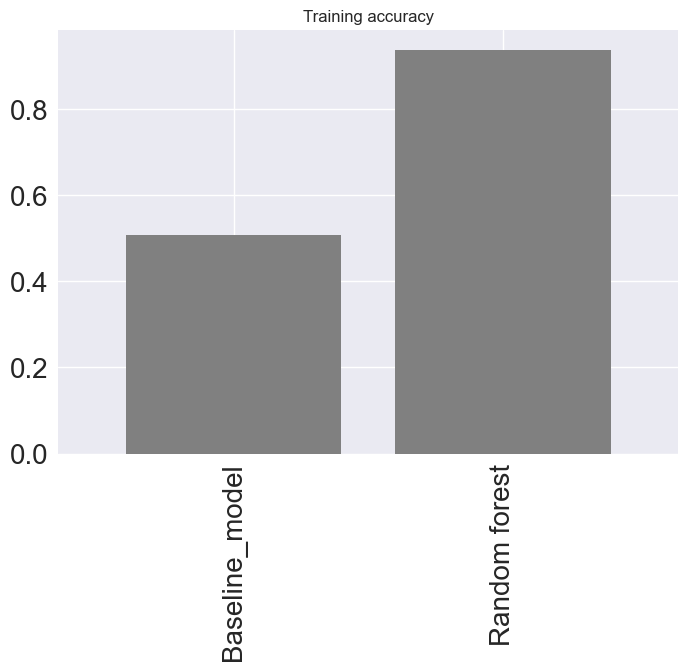

In [99]:
#Compare training and testing accuracy
pd.Series(accuracy_dict).plot(kind="bar",title="Training accuracy",width=0.8,color="grey", fontsize=20)

<AxesSubplot:title={'center':'Test accuracy'}>

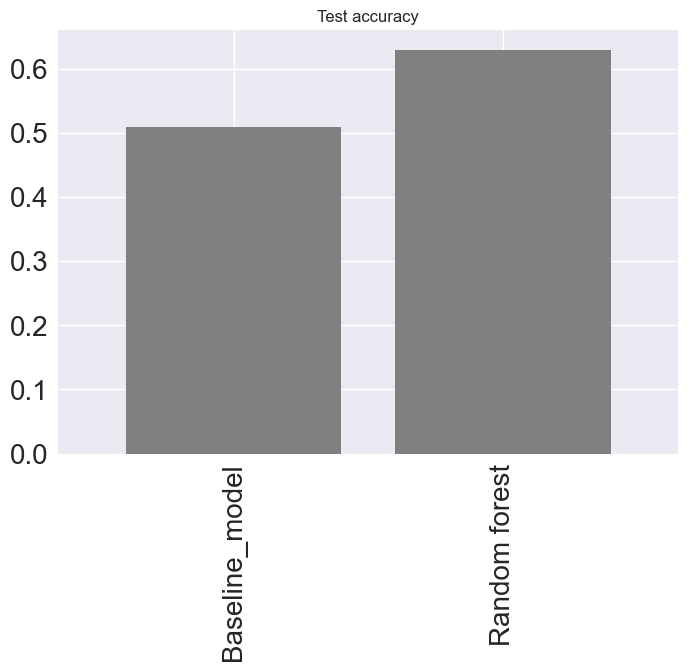

In [100]:
#Compare training and testing accuracy
pd.Series(accuracy_dict1).plot(kind="bar",title="Test accuracy",width=0.8, color="grey",fontsize=20)

### **Observation**

This Machine Learning Model delves into predicting whether a crime is severe or non-severe by utilizing various features such as socioeconomic factors, crime types, primary location, and districts. The dataset comprises Chicago crime data merged with socioeconomic information, forming a comprehensive dataset to train machine learning models. Initially, the code preprocesses the data by forming dummy variables for crime types and districts while incorporating socioeconomic factors like income, unemployment rates, and hardship indexes. Standardizing the dataset ensures a uniform scale for the features, contributing to improved model performance.

The implementation utilizes Random Forest, a robust ensemble learning method capable of handling complex datasets. The obtained results reveal a strong training accuracy of 94% for the Random Forest model, while the test accuracy stands at 63%. Although the training accuracy is notably high, the test accuracy indicates a certain level of **overfitting** or **a lack of generalization power** in the model when applied to unseen data. This discrepancy between training and test accuracies suggests the model might be too complex or might have overfit the training data, failing to generalize well on new instances. Further fine-tuning or feature selection methods could potentially enhance the model's generalization capability, ensuring better performance on unseen data and improving its real-world applicability. Overall, while the model demonstrates a reasonably accurate prediction for training data, the test results indicate a need for refinement to achieve better generalization and predictive power on new instances.